# Combining etalon and fringe data for wavelength calibration
In this notebook we perform an absolute wavelength calibration using both the etalon and extended source fringe data in band 1C.  
  
Notebook creation date: December 15th 2017  
Author: Ioannis Argyriou (Institute of Astronomy, KUL)  
Email: ioannis.argyriou@kuleuven.be

## > Import modules

In [1]:
from distortionMaps import d2cMapping
import mrs_aux as maux
import funcs
from tmm_core import unpolarized_RT
from ivs.timeseries import pergrams

import numpy as np
from astropy.io import fits
from scipy.optimize import curve_fit
import scipy.interpolate as scp_interpolate
from matplotlib import pyplot as plt
%matplotlib notebook

import warnings
warnings.simplefilter('ignore')


## > Get data

In [17]:
# Define paths to data
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
cdpDir   = workDir+'cdp_data/'
lvl2path = workDir+'/FM_data/LVL2/'
MRSWaveCalDir = workDir+'MRSWaveCal/'

# Get data
# Etalon_1A FM data, band 1C/2C
sci_etalon1A_img = fits.open(MRSWaveCalDir+'EtalonFMdata_band1C/MIRFM1T00010843_1_495_SE_2011-05-18T00h47m06_LVL2.fits')[0].data[0,:,:]
bkg_etalon1A_img = fits.open(MRSWaveCalDir+'EtalonFMdata_band1C/MIRFM1T00010844_1_495_SE_2011-05-18T01h53m59_LVL2.fits')[0].data[0,:,:]

etalon1A_img = sci_etalon1A_img-bkg_etalon1A_img

# Etalon_1B FM data, band 1C/2C
sci_etalon1B_img = fits.open(MRSWaveCalDir+'EtalonFMdata_band1C/MIRFM1T00010943_1_495_SE_2011-05-20T03h23m04_LVL2.fits')[0].data[0,:,:]
bkg_etalon1B_img = fits.open(MRSWaveCalDir+'EtalonFMdata_band1C/MIRFM1T00010942_1_495_SE_2011-05-20T02h30m42_LVL2.fits')[0].data[0,:,:]

etalon1B_img = sci_etalon1B_img-bkg_etalon1B_img

# Etalon_1A FM data, band 1A/2A
sci_etalon1A_img = fits.open(lvl2path+'FM1T00010937/MIRFM1T00010937_1_495_SE_2011-05-19T22h24m06_LVL2.fits')[0].data[0,:,:]
bkg_etalon1A_img = fits.open(lvl2path+'FM1T00010938/MIRFM1T00010938_1_495_SE_2011-05-19T23h16m52_LVL2.fits')[0].data[0,:,:]

etalon1A_img = sci_etalon1A_img-bkg_etalon1A_img

# Etalon_1B FM data, band 1A/2A
sci_etalon1B_img = fits.open(lvl2path+'FM1T00010918/MIRFM1T00010918_1_495_SE_2011-05-19T15h17m35_LVL2.fits')[0].data[0,:,:]
bkg_etalon1B_img = fits.open(lvl2path+'FM1T00010919/MIRFM1T00010919_1_495_SE_2011-05-19T16h04m35_LVL2.fits')[0].data[0,:,:]

etalon1B_img = sci_etalon1B_img-bkg_etalon1B_img

# Extended source FM data, band 1A/2A
sci_file = lvl2path+'FM1T00011282/MIRFM1T00011282_1_495_SE_2011-05-31T02h15m32_LVL2.fits'
bkg_file = lvl2path+'FM1T00011285/MIRFM1T00011285_1_495_SE_2011-05-31T05h06m47_LVL2.fits'

reduced_img_subchanA = fits.open(sci_file)[0].data[0,:,:]-fits.open(bkg_file)[0].data[0,:,:]

# Extended source FM data, band 1B/2B
sci_file = lvl2path+'FM1T00011283/MIRFM1T00011283_1_495_SE_2011-05-31T03h12m30_LVL2.fits'
bkg_file = lvl2path+'FM1T00011286/MIRFM1T00011286_1_495_SE_2011-05-31T06h03m43_LVL2.fits'

reduced_img_subchanB = fits.open(sci_file)[0].data[0,:,:]-fits.open(bkg_file)[0].data[0,:,:]

# Extended source FM data, band 1C/2C
sci_file = lvl2path+'FM1T00011284/MIRFM1T00011284_1_495_SE_2011-05-31T04h09m25_LVL2.fits'
bkg_file = lvl2path+'FM1T00011287/MIRFM1T00011287_1_495_SE_2011-05-31T07h00m44_LVL2.fits'

reduced_img_subchanC = fits.open(sci_file)[0].data[0,:,:]-fits.open(bkg_file)[0].data[0,:,:]

# choose single observation
reduced_img = reduced_img_subchanC.copy()

# FTS Etalon data (need to extrapolate to operating temperatures (~35 K)?)
etalon1A = MRSWaveCalDir+'MIRI_b_E1av_etalon1A_77K.txt'
etalon1B = MRSWaveCalDir+'MIRI_b_G3av_etalon1B_80K.txt'
wvnrs1A,etalon1A = np.genfromtxt(etalon1A, skip_footer = 1, usecols=(0,1), delimiter = '',unpack='True')
wvnrs1B,etalon1B = np.genfromtxt(etalon1B, skip_footer = 1, usecols=(0,1), delimiter = '',unpack='True')

# Read the measured transmission curves from the dat files
# first colum is wavenumber [cm-1]
# second and third columns are room temperature transmissions
# fourth column is 35K transmission
LWPwvnr,LWPtransm = np.genfromtxt(MRSWaveCalDir + "lwp_filter.txt", skip_header = 15, skip_footer=1, usecols=(0,3), delimiter = '',unpack='True')
LWPwave = 10000./LWPwvnr
LWPtransm = LWPtransm/100. # convert percentage to decimal

# MRS detector images (processed with DHAS 9.2.4 miri_sloper only ==> LVL2 images)
#--top: LWP filter extended obs (LWP transm x 800K BB), bottom: 800K BB HOLE config
FM1T00010841_1 = fits.open(MRSWaveCalDir+'LWP_filter/MIRFM1T00010841_1_495_SE_2011-05-17T22h54m09_LVL2.fits')[0].data[0,:,:]
FM1T00010842_1 = fits.open(MRSWaveCalDir+'LWP_filter/MIRFM1T00010842_1_495_SE_2011-05-17T23h35m45_LVL2.fits')[0].data[0,:,:]

# apply division (to get back LWP transmission)
lwp_transm_img = FM1T00010841_1/FM1T00010842_1

In [125]:
# Get spectral band
band = '1A'

# Get cdps
fringe_file,photom_file,psf_file,resol_file = funcs.get_cdps(cdpDir=cdpDir,band=band)

fringe_img     = fits.open(fringe_file)[1].data        # [unitless]
photom_img     = fits.open(photom_file)[1].data        # [DN/s * pixel/mJy]
pixsiz_img     = fits.open(photom_file)[5].data        # [arcsec^2/pix]
psffits        = fits.open(psf_file)                   # [unitless]
specres_table  = fits.open(resol_file)[1].data         # [unitless]

# Get distortion maps
#> detector dimensions in pixels
det_dims = (1024,1032)
# compute coordinate maps for spectral band
d2cMaps = d2cMapping(band,cdpDir)
# extract single maps
sliceMap  = d2cMaps['sliceMap']
alphaMap  = d2cMaps['alphaMap']
betaMap   = d2cMaps['betaMap']
lambdaMap = d2cMaps['lambdaMap']
nslices   = maux.MRS_nslices[band[0]]
bzero     = d2cMaps['bzero']
bdel      = d2cMaps['bdel']
mrs_fwhm  = maux.MRS_FWHM[band[0]]

bandlims = [lambdaMap[np.nonzero(lambdaMap)].min(),lambdaMap[np.nonzero(lambdaMap)].max()]
fov_lims = [alphaMap[np.nonzero(lambdaMap)].min(),alphaMap[np.nonzero(lambdaMap)].max()]
unique_betas = np.sort(np.unique(betaMap[(sliceMap>100*int(band[0])) & (sliceMap<100*(int(band[0])+1))]))


In [112]:
bandlimits = {}
for band in ['1A','1B','1C']:
    d2cMaps = d2cMapping(band,cdpDir)
    lambdaMap = d2cMaps['lambdaMap']
    bandlimits[band] = [lambdaMap[np.nonzero(lambdaMap)].min(),lambdaMap[np.nonzero(lambdaMap)].max()]

In [115]:
print bandlimits['1A']
print bandlimits['1B']
print bandlimits['1C']

print bandlimits['1B'][0]/bandlimits['1A'][0]
print bandlimits['1C'][0]/bandlimits['1B'][0]

print bandlimits['1B'][1]/bandlimits['1A'][1]
print bandlimits['1C'][1]/bandlimits['1B'][1]

[4.8471638306647682, 5.7754669800973675]
[5.6012370144026322, 6.6738654849364121]
[6.4009773257343143, 7.6108680569479255]
1.15556998073
1.1427792306
1.15555426218
1.14039878001


## > Transform data

<IPython.core.display.Javascript object>


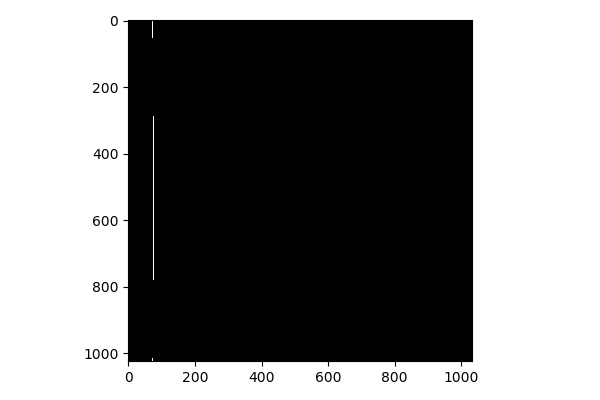

In [36]:
lamblower,lambupper = bandlims[0],bandlims[1]   # nominal wavelength range
islice    = 10                  # slice number (equivalent to beta position)
alpha_pos = 0.                  # along-slice position, [arcsec]
# take pixel trace along specified slice, specified alpha position
ypos,xpos = np.arange(det_dims[0]),np.zeros(det_dims[0]) # initialize placeholders
slice_img,alpha_img,valid_img = [np.full(det_dims,0.) for j in range(3)] # initialize placeholders
sel_pix = (sliceMap == 100*int(band[0])+islice) # select pixels with correct slice number
slice_img[sel_pix] = sliceMap[sel_pix] # image containing single slice
alpha_img[sel_pix] = alphaMap[sel_pix] # image containing alpha positions in single slice

# trace is built by taking the pixel in every detector row with alpha value closest to the one specified
for i in ypos:
    xpos[i] = np.argmin(alpha_img[i,:])+funcs.find_nearest(alpha_img[i,:][(slice_img[i,:]!=0)],alpha_pos)
xpos = xpos.astype(int)
valid_img[ypos,xpos] = 1.

# plot trace
plt.figure(figsize=(6,4))
plt.imshow(valid_img,cmap='gray')
plt.tight_layout()

<IPython.core.display.Javascript object>


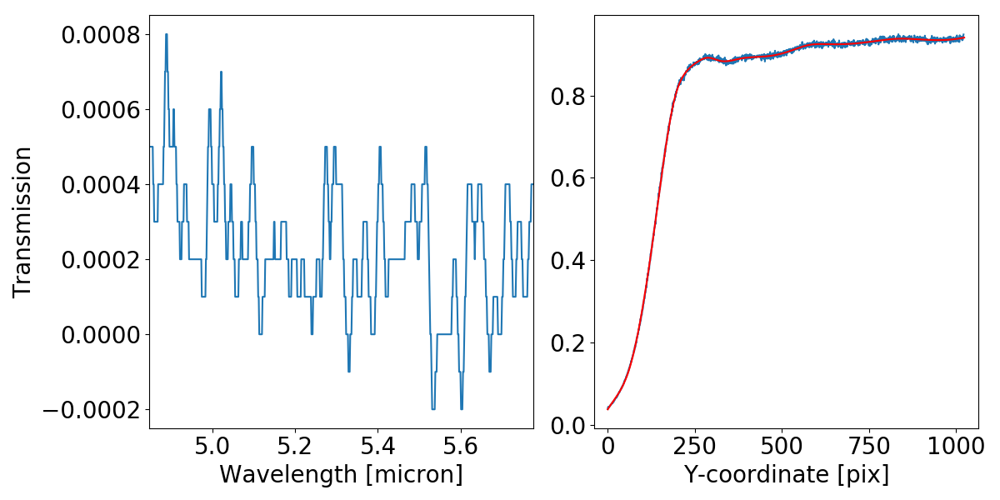

<IPython.core.display.Javascript object>


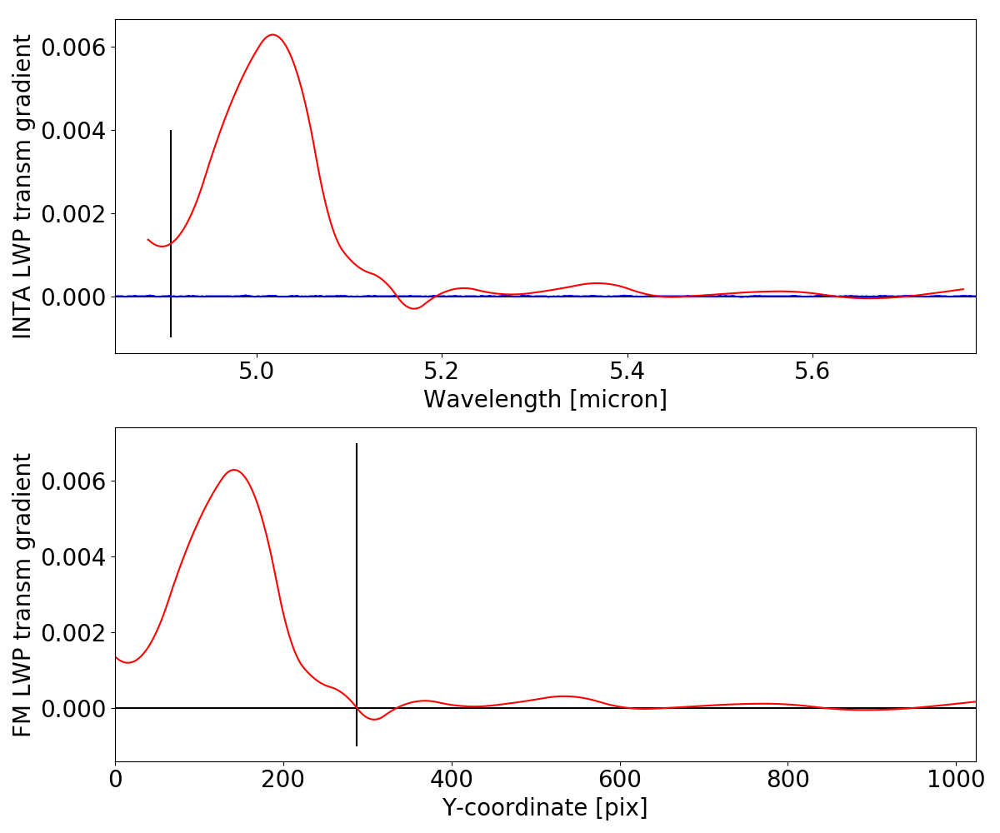

Reference wavelength: 4.907 micron
Reference pixel: 287.908 pix


In [37]:
# load spectrum from desired location and carry-out analysis
sel = (LWPwave>=lamblower) & (LWPwave<=lambupper)

sci_fm_data = lwp_transm_img[ypos,xpos]
sci_fm_data[np.isnan(sci_fm_data)] = 0

# fit spline to data (smoother signal profile)
spl = scp_interpolate.UnivariateSpline(np.arange(len(sci_fm_data[1:-1]) ),sci_fm_data[1:-1])
spl.set_smoothing_factor(0.02)

fig,axs = plt.subplots(1,2,figsize=(12,6))
axs[0].plot(LWPwave[sel],LWPtransm[sel])
axs[0].set_xlim(lamblower,lambupper)
axs[0].tick_params(axis='both',labelsize=20)
axs[0].set_xlabel('Wavelength [micron]',fontsize=20)
axs[0].set_ylabel('Transmission',fontsize=20)
axs[1].plot(sci_fm_data[np.nonzero(sci_fm_data)])
axs[1].plot(spl(np.arange(len(sci_fm_data))),'r')
axs[1].set_xlim(-40,1064)
axs[1].set_xlabel('Y-coordinate [pix]',fontsize=20)
axs[1].tick_params(axis='both',labelsize=20)
plt.tight_layout()

# Reference wavelength/pixel pair defined by matching zero-crossing of gradient of INTA and FM LWP transmission
LWPgrad = np.gradient(LWPtransm[sel],LWPwave[sel])
LWPsigns = np.sign(LWPgrad)
sci_fm_data_grad = np.gradient(spl(np.arange(len(sci_fm_data))))
sci_fm_data_signs = np.sign(sci_fm_data_grad)

LWPzerocrossing = np.where(np.abs(np.diff(LWPsigns)) == 2)[0]
sci_fm_data_zerocrossing = np.where(np.abs(np.diff(sci_fm_data_signs)) == 2)[0]

x0 = LWPwave[sel][LWPzerocrossing[0]]
x1 = LWPwave[sel][LWPzerocrossing[0]+1]
y0 = LWPgrad[LWPzerocrossing[0]]
y1 = LWPgrad[LWPzerocrossing[0]+1]
a = (y1-y0)/(x1-x0)
cutofflamb = (-y0/a) + x0

x0 = sci_fm_data_zerocrossing[0]
x1 = np.arange(len(sci_fm_data))[sci_fm_data_zerocrossing[0]+1]
y0 = sci_fm_data_grad[sci_fm_data_zerocrossing[0]]
y1 = sci_fm_data_grad[sci_fm_data_zerocrossing[0]+1]
a = (y1-y0)/(x1-x0)
cutoffpix = (-y0/a) + x0

# plot result
fig,axs = plt.subplots(2,1,figsize=(12,10))
axs[0].plot(LWPwave[sel],np.gradient(LWPtransm[sel],LWPwave[sel]),'b')
axs[0].plot(lambdaMap[ypos,xpos],np.gradient(spl(np.arange(1024))),'r')
axs[0].hlines(0,lamblower,lambupper)
axs[0].vlines(cutofflamb,-0.001,0.004)
axs[0].set_xlim(lamblower,lambupper)
axs[1].plot(np.gradient(spl(np.arange(1024))),'r')
axs[1].hlines(0,0,1024)
axs[1].vlines(cutoffpix,-0.001,0.007)
axs[1].set_xlim(0,1023)
axs[0].set_xlabel('Wavelength [micron]',fontsize=20)
axs[0].set_ylabel('INTA LWP transm gradient',fontsize=20)
axs[1].set_xlabel('Y-coordinate [pix]',fontsize=20)
axs[1].set_ylabel('FM LWP transm gradient',fontsize=20)
axs[0].tick_params(axis='both',labelsize=20)
axs[1].tick_params(axis='both',labelsize=20)
plt.tight_layout()

print 'Reference wavelength: {} micron'.format(round(cutofflamb,3))
print 'Reference pixel: {} pix'.format(round(cutoffpix,3))



<IPython.core.display.Javascript object>


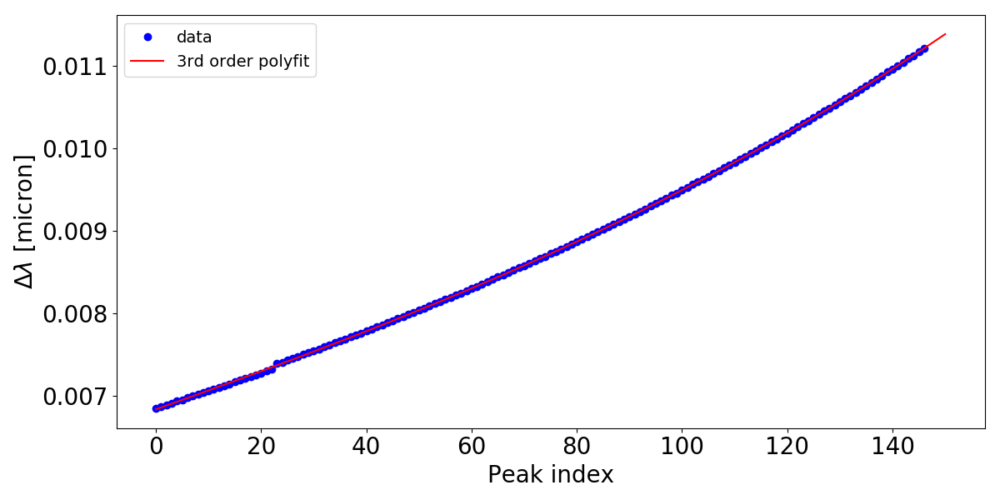

<IPython.core.display.Javascript object>


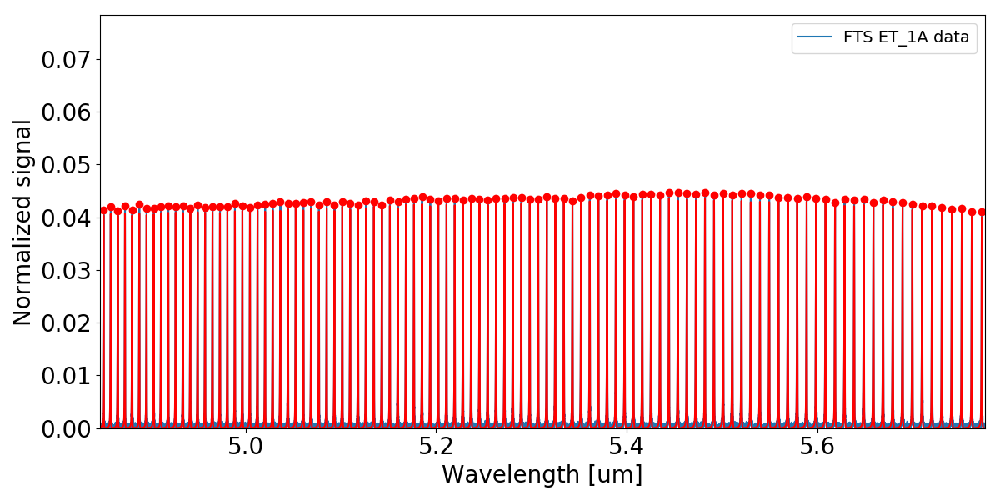

In [70]:
# # correlate etalon lines in FTS and FM data
margin = 0.2 # [micron]
etalon1A_wvl,etalon1A_FTS_data = np.flipud(10000/wvnrs1A),np.flipud(etalon1A)
sel = (etalon1A_wvl>=lamblower-margin) & (etalon1A_wvl<=lambupper+margin)
etalon1A_FTS_wvl,etalon1A_FTS_data = etalon1A_wvl[sel],etalon1A_FTS_data[sel]

FTSetalon1A_peaks = funcs.find_peaks(etalon1A_FTS_data,thres=0.3,min_dist=5)
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FTSetalon1A_peaks,etalon1A_FTS_data[FTSetalon1A_peaks],k=3,ext=3)
etalon1A_FTS_data_profile = arr_interpolator(range(len(etalon1A_FTS_data)))

#-- Fit Etalon_1A lines in FTS data
FTSetalon1A_fitparams,FTS_fitting_flag = funcs.fit_etalon_lines(etalon1A_FTS_wvl,etalon1A_FTS_data,FTSetalon1A_peaks,fit_func='skewed_voight',sigma0=0.001,f0=0.5,a0=0.1)

# etalon line single parameters
FTS_linecenter = [FTSetalon1A_fitparams[i][1] for i in range(len(FTSetalon1A_fitparams))]
FTS_linefwhm   = funcs.get_FWHM(FTSetalon1A_fitparams,FTS_fitting_flag)
FTS_lineskew   = funcs.get_skewness(FTSetalon1A_fitparams,FTS_fitting_flag)

popt_FTS,pcov_FTS = curve_fit(funcs.order3polyfit,np.arange(len(np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)])),np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)] )

plt.figure(figsize=(12,6))
# plt.plot(np.diff(etalon1A_FTS_wvl[FTSetalon1A_peaks]),'bo',label='data')
plt.plot(np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)],'bo',label='data')
plt.plot(np.arange(len(FTSetalon1A_peaks))[:-1],funcs.order3polyfit(np.arange(len(FTSetalon1A_peaks))[:-1],*popt_FTS),'r',label='3rd order polyfit')
# plt.ylim(3.15,3.18)
plt.xlabel('Peak index',fontsize=20)
plt.ylabel(r'$\Delta\lambda$ [micron]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(etalon1A_FTS_wvl,etalon1A_FTS_data,label='FTS ET_1A data') # /etalon1A_FTS_data_profile
plt.plot(etalon1A_FTS_wvl[FTSetalon1A_peaks],(etalon1A_FTS_data)[FTSetalon1A_peaks],'ro') # /etalon1A_FTS_data_profile
funcs.plot_etalon_fit(FTSetalon1A_fitparams,FTS_fitting_flag)
plt.xlim(lamblower,lambupper)
plt.ylim(0)
plt.xlabel('Wavelength [um]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()


<IPython.core.display.Javascript object>


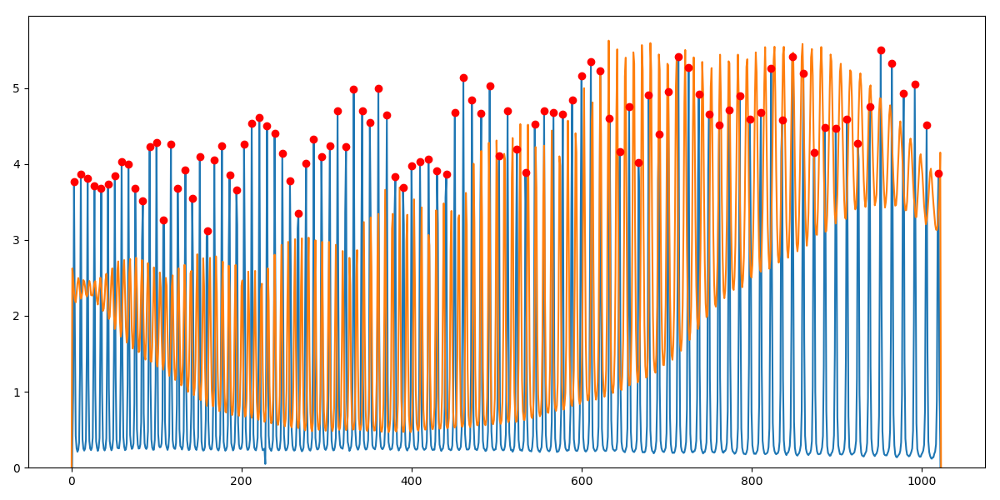

In [152]:
# # correlate etalon lines in FTS and FM data
# etalon1A_FMpix_data = etalon1A_img[ypos,xpos]

# etalon1A_FMpix_data[np.isnan(etalon1A_FMpix_data)] = -1
# FMpixetalon1A_peaks = funcs.find_peaks(etalon1A_FMpix_data,thres=0.3,min_dist=5)
# # etalon1A_FM_data[(etalon1A_FM_data == -1)] = np.nan

# arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMpixetalon1A_peaks,etalon1A_FM_data[FMpixetalon1A_peaks],k=3,ext=3)
# etalon1A_FMpix_data_profile = arr_interpolator(range(len(etalon1A_FMpix_data)))

# #-- Fit Etalon_1A lines in FTS data
# FMpixetalon1A_fitparams,FMpix_fitting_flag = funcs.fit_etalon_lines(np.arange(det_dims[0]),etalon1A_FMpix_data,FMpixetalon1A_peaks,fit_func='skewed_voight',sigma0=5,f0=0.5,a0=0.1)

# # etalon line single parameters
# FMpix_linecenter = [FMpixetalon1A_fitparams[i][1] for i in range(len(FMpixetalon1A_fitparams))]
# FMpix_linefwhm   = funcs.get_FWHM(FMpixetalon1A_fitparams,FMpix_fitting_flag)
# FMpix_lineskew   = funcs.get_skewness(FMpixetalon1A_fitparams,FMpix_fitting_flag)

# popt_FMpix,pcov_FMpix = curve_fit(funcs.order3polyfit,np.arange(len(FMpix_linecenter))[:-1],np.diff(FMpix_linecenter) )

plt.figure(figsize=(12,6))
plt.plot(etalon1A_FMpix_data)
plt.plot(etalon1B_FMpix_data/3)
plt.plot(FMpixetalon1A_peaks,etalon1A_FM_data[FMpixetalon1A_peaks],'ro')
plt.ylim(0)
plt.tight_layout()

# plt.figure(figsize=(12,6))
# plt.plot(FMpix_linecenter[:-1],np.diff(FMpix_linecenter),'bo',label='data')
# plt.plot(FMpix_linecenter[:-1],funcs.order3polyfit(np.arange(len(FMpix_linecenter))[:-1],*popt_FMpix),'r',label='3rd order polyfit')
# # plt.ylim(3.15,3.18)
# plt.xlabel('Peak index',fontsize=20)
# plt.ylabel(r'$\Delta$pix',fontsize=20)
# plt.legend(loc='upper left',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

# plt.figure(figsize=(12,6))
# plt.plot(etalon1A_FMpix_data,label='FMpix ET_1A data') # /etalon1A_FM_data_profile
# plt.plot(FMpixetalon1A_peaks,(etalon1A_FMpix_data)[FMpixetalon1A_peaks],'ro') # /etalon1A_FM_data_profile
# funcs.plot_etalon_fit(FMpixetalon1A_fitparams,FMpix_fitting_flag)
# plt.xlim(0,1024)
# # plt.ylim(0,1.2)
# plt.xlabel('Wavelength [um]',fontsize=20)
# plt.ylabel('Normalized signal',fontsize=20)
# plt.legend(loc='upper right',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()



In [96]:
print popt_FMpix

# [  2.40844014e-10   1.45742593e-08   2.27049587e-05   6.83750468e-03]
# [ -2.36553526e-11   8.27858472e-08   2.21364837e-05   7.58419142e-03]

[  1.18687808e-06   9.97219403e-05   3.94946456e-02   7.86942509e+00]


In [140]:
# # correlate etalon lines in FTS and FM data
# etalon1A_FM_data = etalon1A_img[ypos,xpos]
# etalon1A_FM_wvl = lambdaMap[ypos,xpos]

# etalon1A_FM_data[np.isnan(etalon1A_FM_data)] = -1
# FMetalon1A_peaks = funcs.find_peaks(etalon1A_FM_data,thres=0.3,min_dist=5)
# # etalon1A_FM_data[(etalon1A_FM_data == -1)] = np.nan

# arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMetalon1A_peaks,etalon1A_FM_data[FMetalon1A_peaks],k=3,ext=3)
# etalon1A_FM_data_profile = arr_interpolator(range(len(etalon1A_FM_data)))

# #-- Fit Etalon_1A lines in FTS data
# FMetalon1A_fitparams,FM_fitting_flag = funcs.fit_etalon_lines(etalon1A_FM_wvl,etalon1A_FM_data,FMetalon1A_peaks,fit_func='skewed_voight',sigma0=0.001,f0=0.5,a0=0.1)

# # etalon line single parameters
# FM_linecenter = [FMetalon1A_fitparams[i][1] for i in range(len(FMetalon1A_fitparams))]
# FM_linefwhm   = funcs.get_FWHM(FMetalon1A_fitparams,FM_fitting_flag)
# FM_lineskew   = funcs.get_skewness(FMetalon1A_fitparams,FM_fitting_flag)

# popt_FM,pcov_FM = curve_fit(funcs.order3polyfit,np.arange(len(FM_linecenter))[:-1],np.diff(FM_linecenter) )

plt.figure(figsize=(12,6))
plt.plot(etalon1A_FM_wvl,etalon1A_FM_data)
plt.plot(etalon1A_FM_wvl[FMetalon1A_peaks],etalon1A_FM_data[FMetalon1A_peaks],'ro')
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(FM_linecenter[:-1],np.diff(FM_linecenter),'bo',label='data')
plt.plot(FM_linecenter[:-1],funcs.order3polyfit(np.arange(len(FM_linecenter))[:-1],*popt_FM),'r',label='3rd order polyfit')
# plt.ylim(3.15,3.18)
plt.xlabel('Peak index',fontsize=20)
plt.ylabel(r'$\Delta\lambda$ [micron]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(etalon1A_FM_wvl,etalon1A_FM_data,label='FM ET_1A data') # /etalon1A_FM_data_profile
plt.plot(etalon1A_FM_wvl[FMetalon1A_peaks],(etalon1A_FM_data)[FMetalon1A_peaks],'ro') # /etalon1A_FM_data_profile
funcs.plot_etalon_fit(FMetalon1A_fitparams,FM_fitting_flag)
plt.xlim(bandlims[0],bandlims[1])
# plt.ylim(0,1.2)
plt.xlabel('Wavelength [um]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TypeError: voight_profile() takes exactly 5 arguments (6 given)

<IPython.core.display.Javascript object>


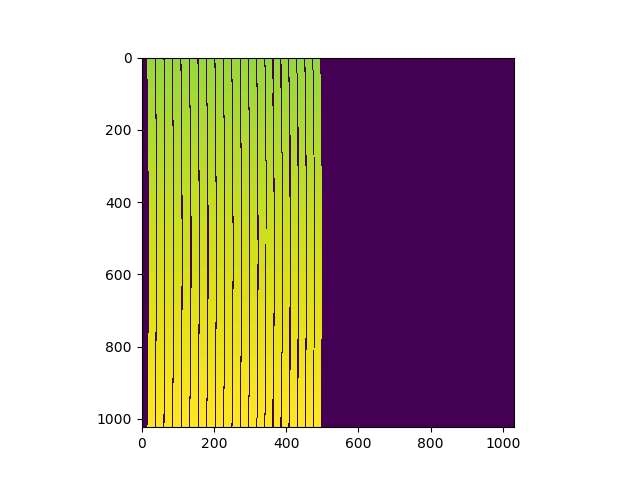

In [100]:
plt.figure()
plt.imshow(lambdaMap)

<IPython.core.display.Javascript object>


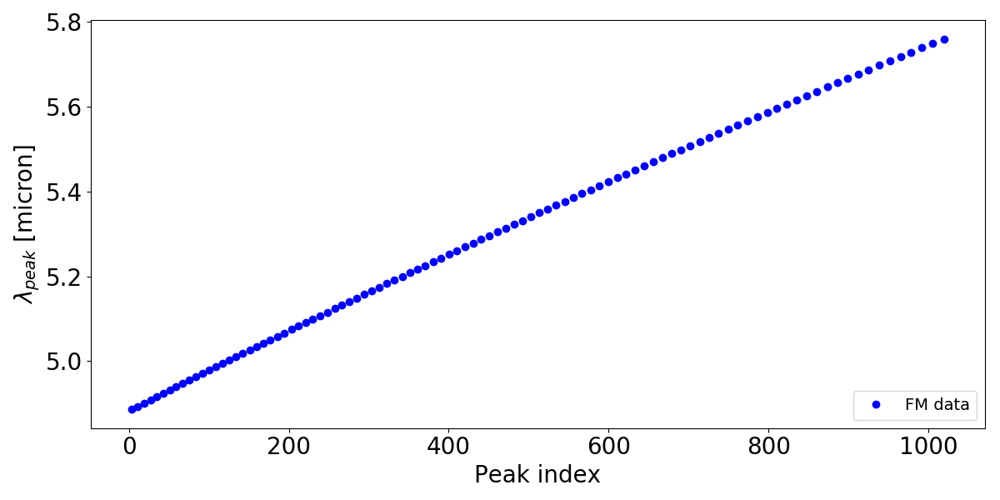

<IPython.core.display.Javascript object>


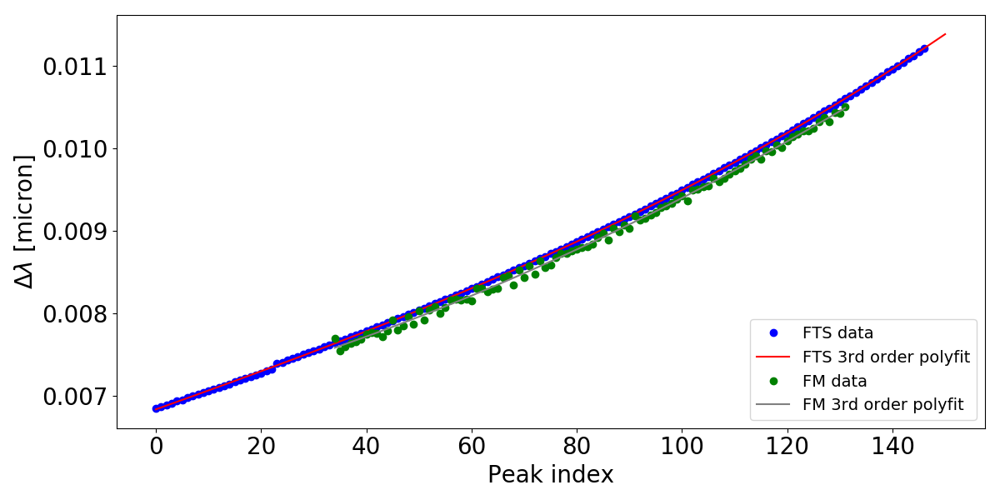

<IPython.core.display.Javascript object>


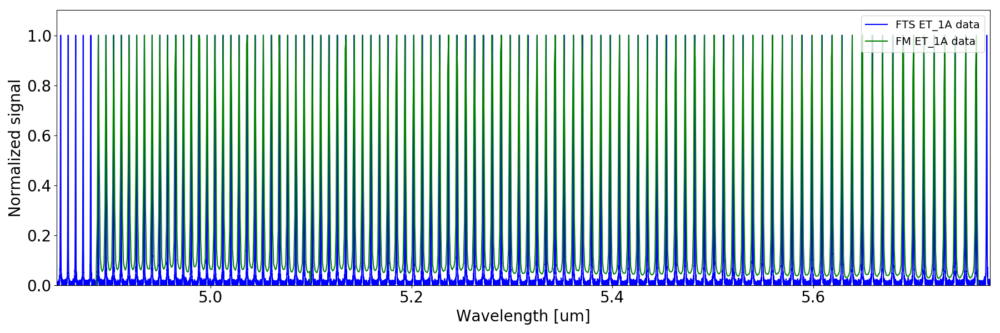

In [99]:
plt.figure(figsize=(12,6))
plt.plot(FMpix_linecenter,FM_linecenter,'bo',label='FM data')
# plt.ylim(3.15,3.18)
plt.xlabel('Peak index',fontsize=20)
plt.ylabel(r'$\lambda_{peak}$ [micron]',fontsize=20)
plt.legend(loc='lower right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)],'bo',label='FTS data')
plt.plot(np.arange(len(FTSetalon1A_peaks))[:-1],funcs.order3polyfit(np.arange(len(FTSetalon1A_peaks))[:-1],*popt_FTS),'r',label='FTS 3rd order polyfit')
plt.plot(np.arange(len(FM_linecenter))[:-1]+34,np.diff(np.array(linecenter)),'go',label='FM data')
plt.plot(np.arange(len(FM_linecenter))[:-1]+34,funcs.order3polyfit(np.arange(len(FM_linecenter))[:-1],*popt_FM),'gray',label='FM 3rd order polyfit')
# plt.ylim(3.15,3.18)
plt.xlabel('Peak index',fontsize=20)
plt.ylabel(r'$\Delta\lambda$ [micron]',fontsize=20)
plt.legend(loc='lower right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(18,6))
plt.plot(etalon1A_FTS_wvl,etalon1A_FTS_data/etalon1A_FTS_data_profile,'b',label='FTS ET_1A data')
plt.plot(etalon1A_FM_wvl+0.0024,etalon1A_FM_data/etalon1A_FM_data_profile,'g',label='FM ET_1A data')
plt.xlim(bandlims[0],bandlims[1])
plt.ylim(0,1.1)
plt.xlabel('Wavelength [um]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

# Etalon 1B

<IPython.core.display.Javascript object>


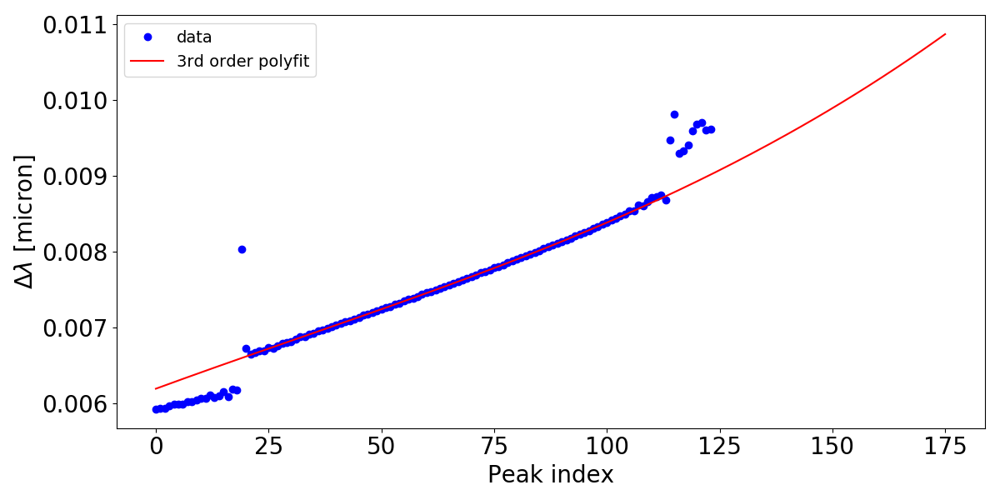

<IPython.core.display.Javascript object>


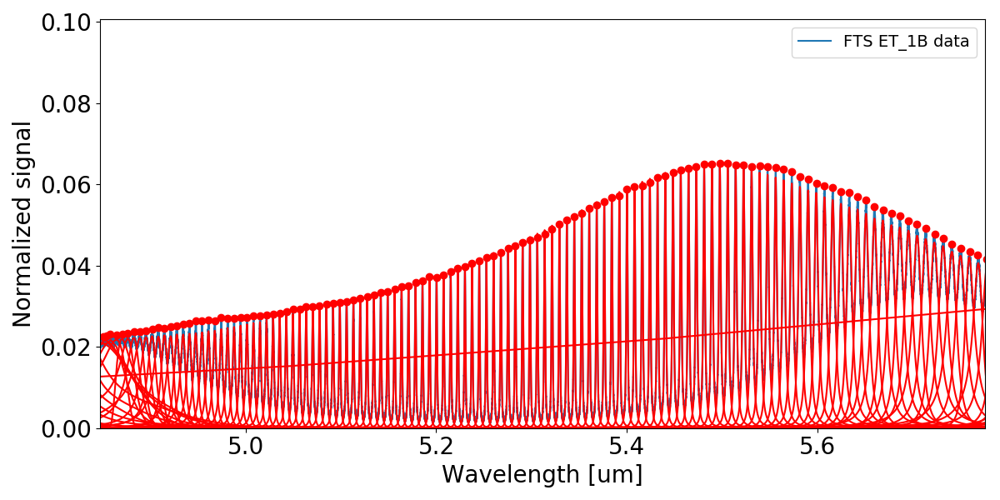

In [111]:
# # correlate etalon lines in FTS and FM data
margin = 0.2 # [micron]
etalon1B_wvl,etalon1B_FTS_data = np.flipud(10000/wvnrs1B),np.flipud(etalon1B)
sel = (etalon1B_wvl>=lamblower-margin) & (etalon1B_wvl<=lambupper+margin)
etalon1B_FTS_wvl,etalon1B_FTS_data = etalon1B_wvl[sel],etalon1B_FTS_data[sel]

FTSetalon1B_peaks = funcs.find_peaks(etalon1B_FTS_data,thres=0.,min_dist=200)
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FTSetalon1B_peaks,etalon1B_FTS_data[FTSetalon1B_peaks],k=3,ext=3)
etalon1B_FTS_data_profile = arr_interpolator(range(len(etalon1B_FTS_data)))

#-- Fit Etalon_1B lines in FTS data
FTSetalon1B_fitparams,FTS_fitting_flag = funcs.fit_etalon_lines(etalon1B_FTS_wvl,etalon1B_FTS_data,FTSetalon1B_peaks,fit_func='skewed_voight',sigma0=0.001,f0=0.5,a0=0.1)

# etalon line single parameters
FTS_linecenter = [FTSetalon1B_fitparams[i][1] for i in range(len(FTSetalon1B_fitparams))]
FTS_linefwhm   = funcs.get_FWHM(FTSetalon1B_fitparams,FTS_fitting_flag)
FTS_lineskew   = funcs.get_skewness(FTSetalon1B_fitparams,FTS_fitting_flag)

popt_FTS,pcov_FTS = curve_fit(funcs.order3polyfit,np.arange(len(np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)]))[25:100],np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)][25:100] )

plt.figure(figsize=(12,6))
# plt.plot(np.diff(etalon1B_FTS_wvl[FTSetalon1B_peaks]),'bo',label='data')
plt.plot(np.diff(FTS_linecenter)[(np.abs(np.diff(np.diff(FTS_linecenter))) < 0.0001)],'bo',label='data')
plt.plot(np.arange(len(FTSetalon1B_peaks))[:-1],funcs.order3polyfit(np.arange(len(FTSetalon1B_peaks))[:-1],*popt_FTS),'r',label='3rd order polyfit')
# plt.ylim(3.15,3.18)
plt.xlabel('Peak index',fontsize=20)
plt.ylabel(r'$\Delta\lambda$ [micron]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(etalon1B_FTS_wvl,etalon1B_FTS_data,label='FTS ET_1B data') # /etalon1B_FTS_data_profile
plt.plot(etalon1B_FTS_wvl[FTSetalon1B_peaks],(etalon1B_FTS_data)[FTSetalon1B_peaks],'ro') # /etalon1B_FTS_data_profile
funcs.plot_etalon_fit(FTSetalon1B_fitparams,FTS_fitting_flag)
plt.xlim(lamblower,lambupper)
plt.ylim(0)
plt.xlabel('Wavelength [um]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()


<IPython.core.display.Javascript object>


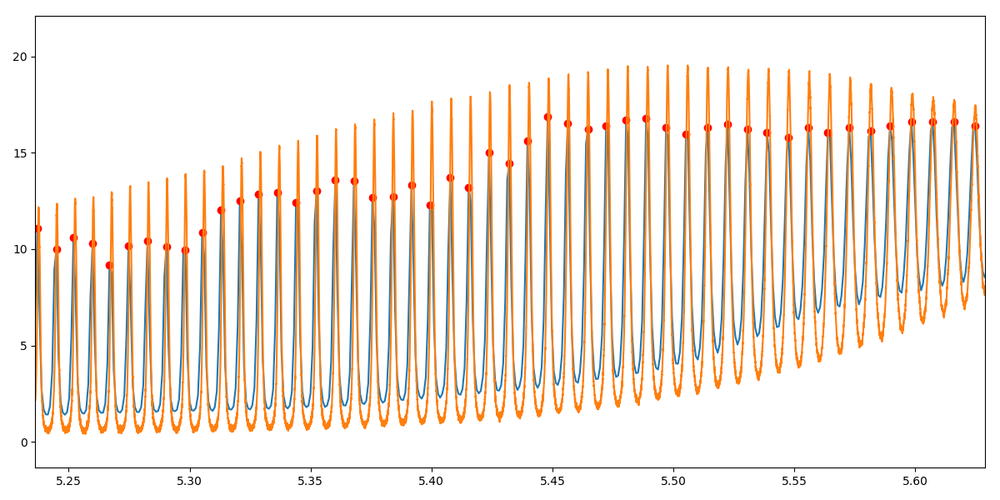

In [136]:
# # correlate etalon lines in FTS and FM data
# etalon1B_FM_data = etalon1B_img[ypos,xpos][np.nonzero(lambdaMap[ypos,xpos])]
# etalon1B_FM_wvl = lambdaMap[ypos,xpos][np.nonzero(lambdaMap[ypos,xpos])]

# etalon1B_FM_data[np.isnan(etalon1B_FM_data)] = -1
# FMetalon1B_peaks = funcs.find_peaks(etalon1B_FM_data,thres=0.3,min_dist=5)
# # etalon1B_FM_data[(etalon1B_FM_data == -1)] = np.nan

# arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMetalon1B_peaks,etalon1B_FM_data[FMetalon1B_peaks],k=3,ext=3)
# etalon1B_FM_data_profile = arr_interpolator(range(len(etalon1B_FM_data)))

# #-- Fit Etalon_1B lines in FTS data
# FMetalon1B_fitparams,FM_fitting_flag = funcs.fit_etalon_lines(etalon1B_FM_wvl,etalon1B_FM_data,FMetalon1B_peaks,fit_func='skewed_voight',sigma0=0.001,f0=0.5,a0=0.1)

# # etalon line single parameters
# FM_linecenter = [FMetalon1B_fitparams[i][1] for i in range(len(FMetalon1B_fitparams))]
# FM_linefwhm   = funcs.get_FWHM(FMetalon1B_fitparams,FM_fitting_flag)
# FM_lineskew   = funcs.get_skewness(FMetalon1B_fitparams,FM_fitting_flag)

# popt_FM,pcov_FM = curve_fit(funcs.order3polyfit,np.arange(len(FM_linecenter))[:-1],np.diff(FM_linecenter) )

plt.figure(figsize=(12,6))
plt.plot(etalon1B_FM_wvl-0.002,etalon1B_FM_data)
plt.plot(etalon1B_FM_wvl[FMetalon1B_peaks]-0.002,etalon1B_FM_data[FMetalon1B_peaks],'ro')
plt.plot(etalon1B_FTS_wvl,etalon1B_FTS_data*300,label='FTS ET_1B data')
plt.tight_layout()

# plt.figure(figsize=(12,6))
# plt.plot(FM_linecenter[:-1],np.diff(FM_linecenter),'bo',label='data')
# plt.plot(FM_linecenter[:-1],funcs.order3polyfit(np.arange(len(FM_linecenter))[:-1],*popt_FM),'r',label='3rd order polyfit')
# # plt.ylim(3.15,3.18)
# plt.xlabel('Peak index',fontsize=20)
# plt.ylabel(r'$\Delta\lambda$ [micron]',fontsize=20)
# plt.legend(loc='upper left',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

# plt.figure(figsize=(12,6))
# plt.plot(etalon1B_FM_wvl,etalon1B_FM_data,label='FM ET_1B data') # /etalon1B_FM_data_profile
# plt.plot(etalon1B_FM_wvl[FMetalon1B_peaks],(etalon1B_FM_data)[FMetalon1B_peaks],'ro') # /etalon1B_FM_data_profile
# funcs.plot_etalon_fit(FMetalon1B_fitparams,FM_fitting_flag)
# plt.xlim(bandlims[0],bandlims[1])
# # plt.ylim(0,1.2)
# plt.xlabel('Wavelength [um]',fontsize=20)
# plt.ylabel('Normalized signal',fontsize=20)
# plt.legend(loc='upper right',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()


<IPython.core.display.Javascript object>


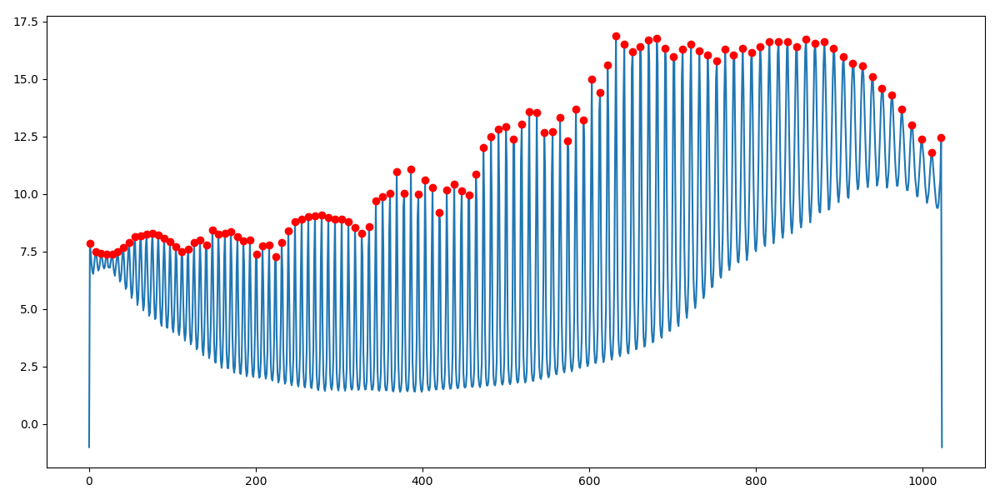

<IPython.core.display.Javascript object>


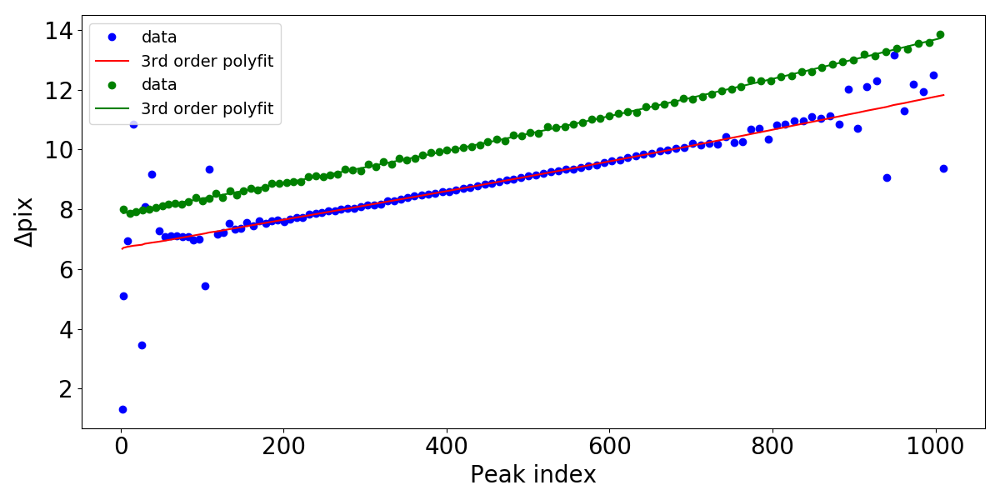

<IPython.core.display.Javascript object>


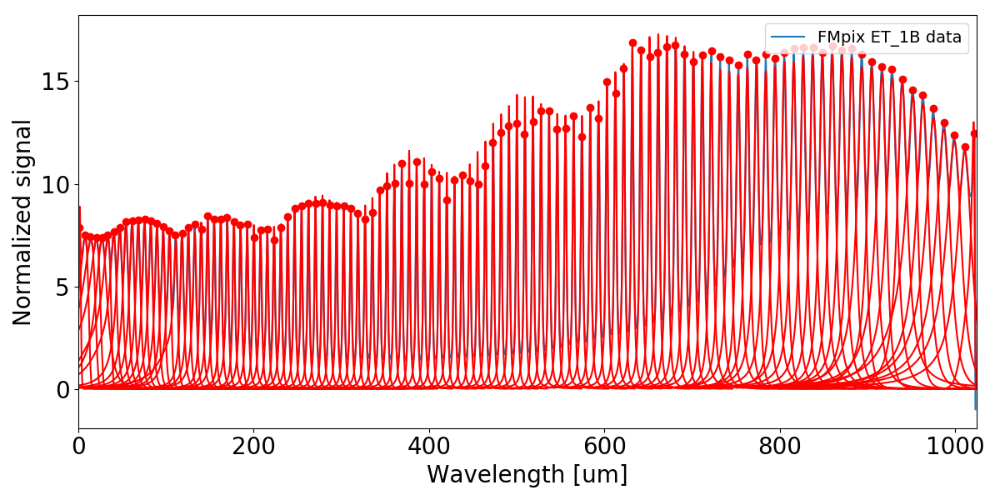

In [146]:
# correlate etalon lines in FTS and FM data
etalon1B_FMpix_data = etalon1B_img[ypos,xpos]

etalon1B_FMpix_data[np.isnan(etalon1B_FMpix_data)] = -1
FMpixetalon1B_peaks = funcs.find_peaks(etalon1B_FMpix_data,thres=0.3,min_dist=5)
# etalon1B_FM_data[(etalon1B_FM_data == -1)] = np.nan

arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMpixetalon1B_peaks,etalon1B_FM_data[FMpixetalon1B_peaks],k=3,ext=3)
etalon1B_FMpix_data_profile = arr_interpolator(range(len(etalon1B_FMpix_data)))

#-- Fit Etalon_1B lines in FTS data
FMpixetalon1B_fitparams,FMpix_fitting_flag = funcs.fit_etalon_lines(np.arange(det_dims[0]),etalon1B_FMpix_data,FMpixetalon1B_peaks,fit_func='skewed_voight',sigma0=5,f0=0.5,a0=0.1)

# etalon line single parameters
FMpix_linecenter2 = [FMpixetalon1B_fitparams[i][1] for i in range(len(FMpixetalon1B_fitparams))]
FMpix_linefwhm   = funcs.get_FWHM(FMpixetalon1B_fitparams,FMpix_fitting_flag)
FMpix_lineskew   = funcs.get_skewness(FMpixetalon1B_fitparams,FMpix_fitting_flag)

popt_FMpix2,pcov_FMpix = curve_fit(funcs.order3polyfit,np.arange(len(FMpix_linecenter2))[:-1][25:90],np.diff(FMpix_linecenter2)[25:90] )

plt.figure(figsize=(12,6))
plt.plot(etalon1B_FMpix_data)
plt.plot(FMpixetalon1B_peaks,etalon1B_FM_data[FMpixetalon1B_peaks],'ro')
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(FMpix_linecenter2[:-1],np.diff(FMpix_linecenter2),'bo',label='data')
plt.plot(FMpix_linecenter2[:-1],funcs.order3polyfit(np.arange(len(FMpix_linecenter2))[:-1],*popt_FMpix2),'r',label='3rd order polyfit')
plt.plot(FMpix_linecenter[:-1],np.diff(FMpix_linecenter),'go',label='data')
plt.plot(FMpix_linecenter[:-1],funcs.order3polyfit(np.arange(len(FMpix_linecenter))[:-1],*popt_FMpix),'g',label='3rd order polyfit')
# plt.ylim(3.15,3.18)
plt.xlabel('Peak index',fontsize=20)
plt.ylabel(r'$\Delta$pix',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(etalon1B_FMpix_data,label='FMpix ET_1B data') # /etalon1B_FM_data_profile
plt.plot(FMpixetalon1B_peaks,(etalon1B_FMpix_data)[FMpixetalon1B_peaks],'ro') # /etalon1B_FM_data_profile
funcs.plot_etalon_fit(FMpixetalon1B_fitparams,FMpix_fitting_flag)
plt.xlim(0,1024)
# plt.ylim(0,1.2)
plt.xlabel('Wavelength [um]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()


In [17]:
(1823.4582432620938/1835.)

0.9937102143117678

<IPython.core.display.Javascript object>


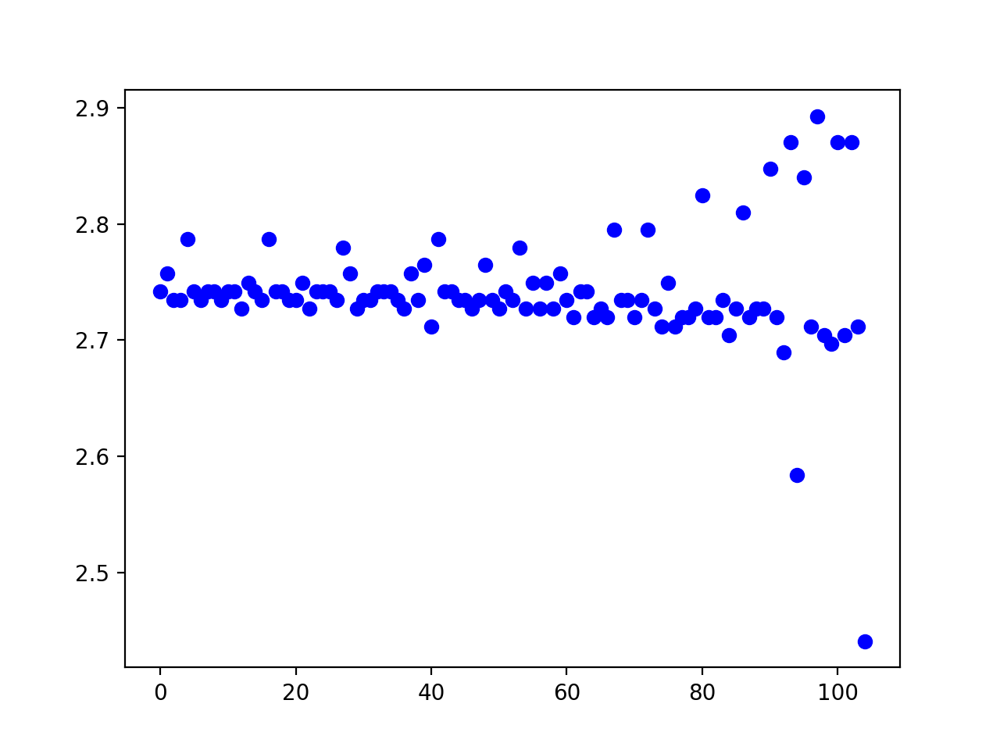

<IPython.core.display.Javascript object>


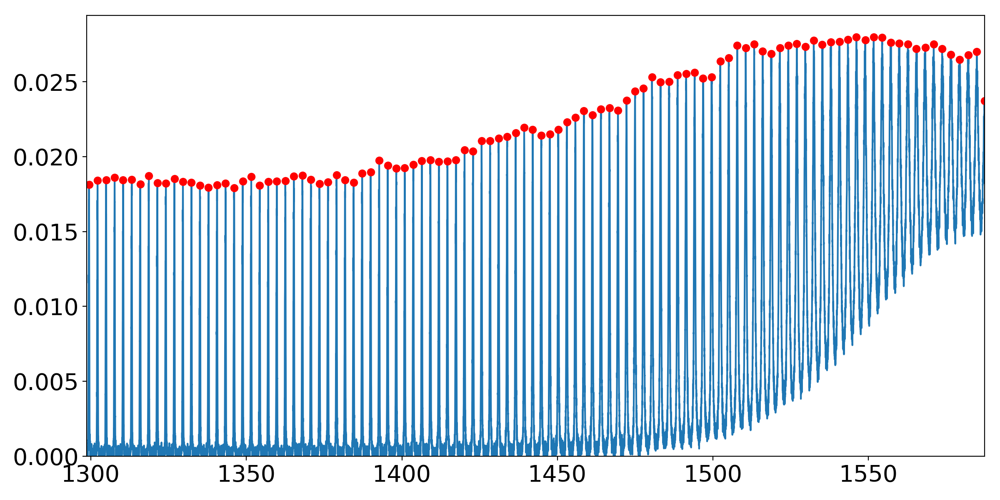

<IPython.core.display.Javascript object>


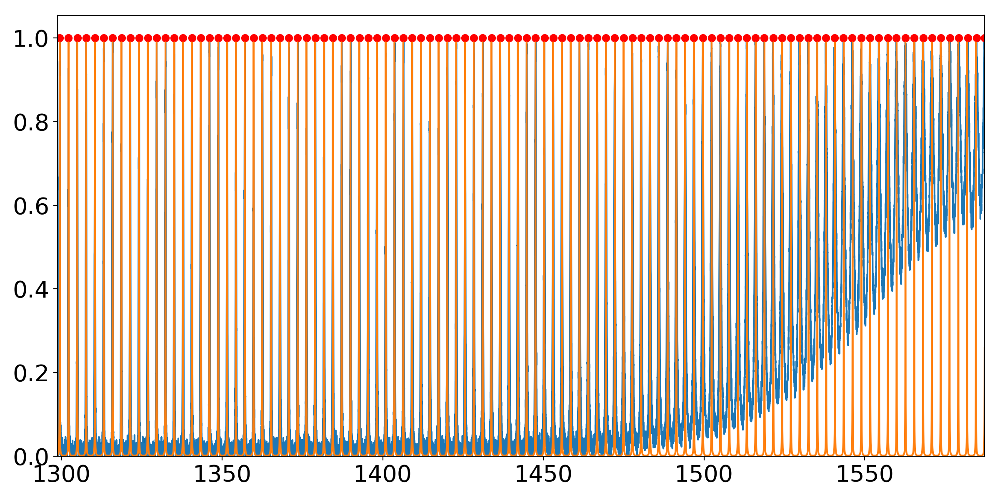

In [18]:
# correlate etalon lines in FTS and FM data
sel = (wvnrs1B>=wvnrlower) & (wvnrs1B<=wvnrupper)
wvnrs1B_FTS_data,etalon1B_FTS_data = wvnrs1B[sel],etalon1B[sel]

FTSetalon1B_peaks = funcs.find_peaks(etalon1B_FTS_data,thres=0.6,min_dist=160)
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FTSetalon1B_peaks,etalon1B_FTS_data[FTSetalon1B_peaks],k=3,ext=3)
etalon1B_FTS_data_profile = arr_interpolator(range(len(etalon1B_FTS_data)))

plt.figure()
plt.plot(np.diff(wvnrs1B_FTS_data[FTSetalon1B_peaks]),'bo')

plt.figure(figsize=(12,6))
plt.plot(wvnrs1B_FTS_data,etalon1B_FTS_data)
plt.plot(wvnrs1B_FTS_data[FTSetalon1B_peaks],etalon1B_FTS_data[FTSetalon1B_peaks],'ro')
# plt.vlines(np.arange(410,490)*3.1638952246 + (3.1638952246/2.),0,1.1)
# plt.plot(wvnrs1B_FTS_data, funcs.FPfunc(wvnrs1B_FTS_data,0.935,1./(2.*2.7420425),0.34))
plt.xlim(wvnrlower,wvnrupper)
plt.ylim(0)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(wvnrs1B_FTS_data,etalon1B_FTS_data/etalon1B_FTS_data_profile)
plt.plot(wvnrs1B_FTS_data[FTSetalon1B_peaks],(etalon1B_FTS_data/etalon1B_FTS_data_profile)[FTSetalon1B_peaks],'ro')
# plt.vlines(np.arange(410,490)*3.1638952246 + (3.1638952246/2.),0,1.1)
plt.plot(wvnrs1B_FTS_data, funcs.FPfunc(wvnrs1B_FTS_data,0.935,1./(2.*2.7420425),0.34))
plt.xlim(wvnrlower,wvnrupper)
plt.ylim(0)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

<IPython.core.display.Javascript object>


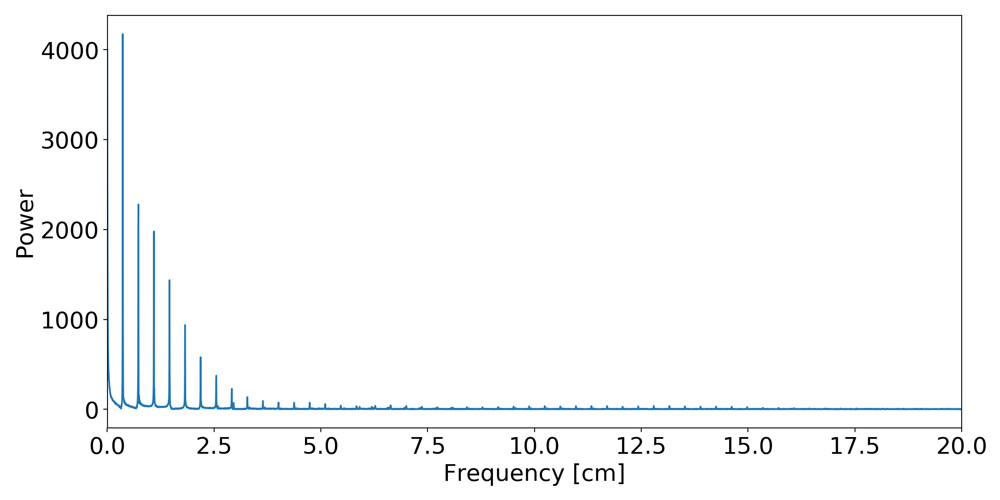

In [19]:
wvnr_equi = np.linspace(wvnrs1B_FTS_data[0],wvnrs1B_FTS_data[-1],len(wvnrs1B_FTS_data))
arr_equi  = scp_interpolate.interp1d(wvnrs1B_FTS_data,etalon1B_FTS_data/etalon1B_FTS_data_profile)(wvnr_equi)

freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0]) # nyquist frequency
sp = np.fft.fft(arr_equi)
power = np.sqrt(sp.real**2 + sp.imag**2)

sel = (freq>0)
plt.figure(figsize=(12,6))
plt.plot(freq[sel],power[sel])
plt.xlim(freq[sel][~np.isnan(power[sel])].min(),20)
plt.xlabel('Frequency [cm]',fontsize=20)
plt.ylabel('Power',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

In [20]:
# Choose data regions
#--FM data
etalon1A_fm_data = etalon1A_img[ypos,xpos]
etalon1B_fm_data = etalon1B_img[ypos,xpos]

# Determine etalon peaks
#--FM Etalon_1A data
etalon1A_fm_data[np.isnan(etalon1A_fm_data)] = -1
FMetalon1A_peaks = funcs.find_peaks(etalon1A_fm_data,thres=0.1,min_dist=9)
etalon1A_fm_data[(etalon1A_fm_data == -1)] = np.nan
etalon1A_fm_data_noNaN = etalon1A_fm_data.copy()
etalon1A_fm_data_noNaN[np.isnan(etalon1A_fm_data)] = 0.
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMetalon1A_peaks,etalon1A_fm_data[FMetalon1A_peaks],k=3,ext=3)
etalon1A_fm_data_profile = arr_interpolator(range(len(etalon1A_fm_data)))

#--FM Etalon_1B data
etalon1B_fm_data[np.isnan(etalon1B_fm_data)] = -1
FMetalon1B_peaks = funcs.find_peaks(etalon1B_fm_data,thres=0.1,min_dist=0)
FMetalon1B_peaks = np.delete(FMetalon1B_peaks,[0,len(FMetalon1B_peaks)-1])
etalon1B_fm_data[(etalon1B_fm_data == -1)] = np.nan
etalon1B_fm_data_noNaN = etalon1B_fm_data.copy()
etalon1B_fm_data_noNaN[np.isnan(etalon1B_fm_data)] = 0.
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMetalon1B_peaks,etalon1B_fm_data[FMetalon1B_peaks],k=3,ext=3)
etalon1B_fm_data_profile = arr_interpolator(range(len(etalon1B_fm_data)))

#--FM extended source data, band 1A/2A
arr0  = reduced_img_subchanA[ypos,xpos]
arr0[np.isnan(arr0)] = 0.

#> determine local minima/maxima
test_arr1 = arr0.copy()
test_arr1[test_arr1<0] = 0
ext_source_fringe_peaks_subchanA = funcs.find_peaks(test_arr1,thres=0,min_dist=4)
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(ext_source_fringe_peaks_subchanA,arr0[ext_source_fringe_peaks_subchanA],k=3,ext=3)
ext_source_fringe_profile_subchanA = arr_interpolator(range(len(arr0)))

#--FM extended source data, band 1B/2B
arr0  = reduced_img_subchanB[ypos,xpos]
arr0[np.isnan(arr0)] = 0.

#> determine local minima/maxima
test_arr1 = arr0.copy()
test_arr1[test_arr1<0] = 0
ext_source_fringe_peaks_subchanB = funcs.find_peaks(test_arr1,thres=0,min_dist=4)
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(ext_source_fringe_peaks_subchanB,arr0[ext_source_fringe_peaks_subchanB],k=3,ext=3)
ext_source_fringe_profile_subchanB = arr_interpolator(range(len(arr0)))

#--FM extended source data, band 1C/2C
arr0  = reduced_img_subchanC[ypos,xpos]
arr0[np.isnan(arr0)] = 0.

#> determine local minima/maxima
test_arr1 = arr0.copy()
test_arr1[test_arr1<0] = 0
ext_source_fringe_peaks_subchanC = funcs.find_peaks(test_arr1,thres=0,min_dist=9)
arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(ext_source_fringe_peaks_subchanC,arr0[ext_source_fringe_peaks_subchanC],k=3,ext=3)
ext_source_fringe_profile_subchanC = arr_interpolator(range(len(arr0)))


In [21]:
wvnrMap_band1A = np.flipud(10000./d2cMapping('1A',cdpDir)['lambdaMap'])
wvnrMap_band1B = np.flipud(10000./d2cMapping('1B',cdpDir)['lambdaMap'])
wvnrMap_band1C = np.flipud(10000./d2cMapping('1C',cdpDir)['lambdaMap'])

<IPython.core.display.Javascript object>


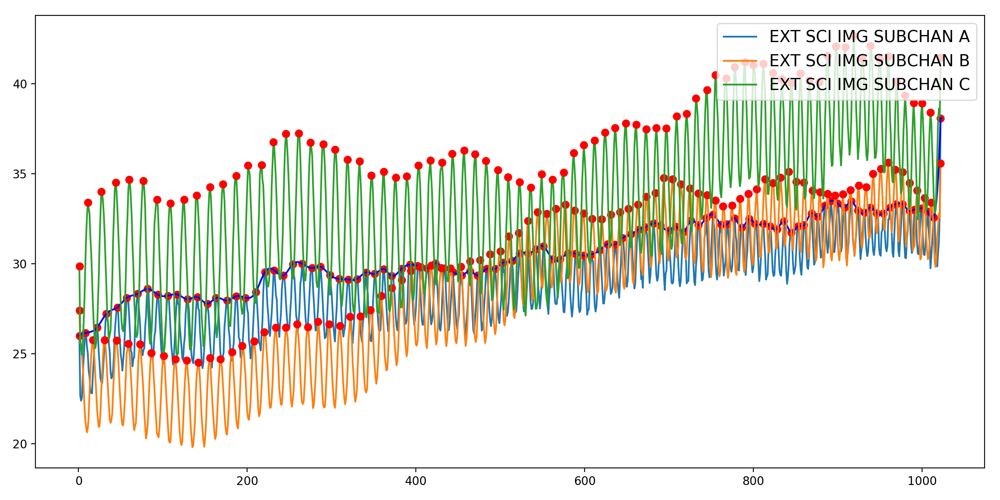

<IPython.core.display.Javascript object>


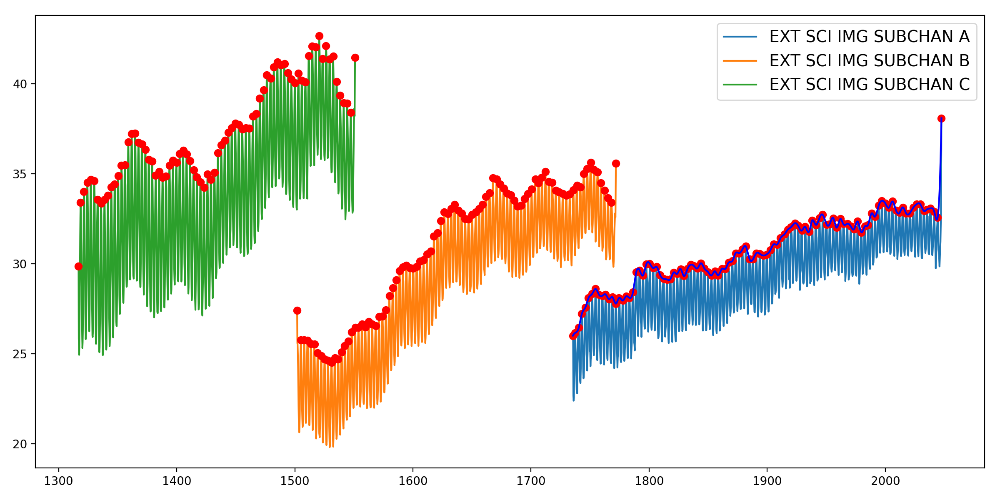

<IPython.core.display.Javascript object>


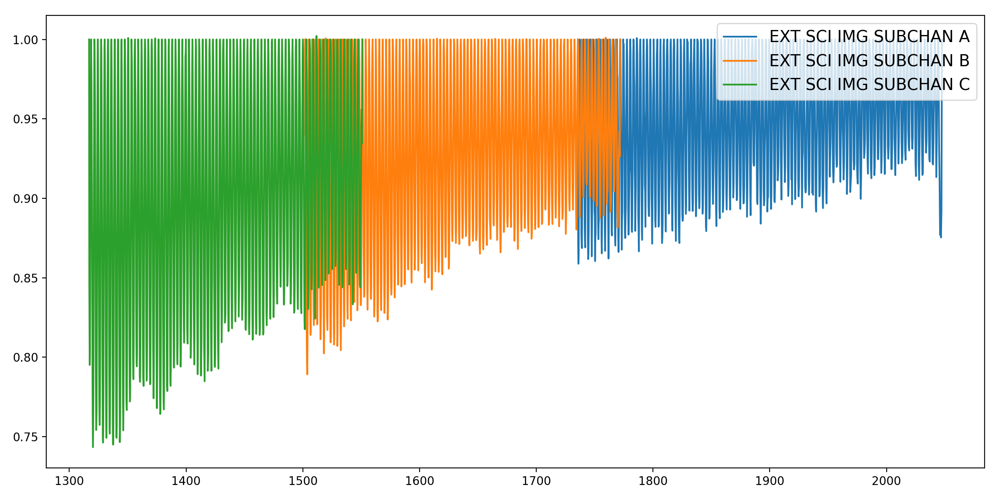

In [22]:
plt.figure(figsize=(12,6))
plt.plot(reduced_img_subchanA[ypos,xpos],label='EXT SCI IMG SUBCHAN A')
plt.plot(ext_source_fringe_peaks_subchanA,reduced_img_subchanA[ypos,xpos][ext_source_fringe_peaks_subchanA],'ro')
plt.plot(ext_source_fringe_profile_subchanA,'b')
plt.plot(reduced_img_subchanB[ypos,xpos],label='EXT SCI IMG SUBCHAN B')
plt.plot(ext_source_fringe_peaks_subchanB,reduced_img_subchanB[ypos,xpos][ext_source_fringe_peaks_subchanB],'ro')
plt.plot(reduced_img_subchanC[ypos,xpos],label='EXT SCI IMG SUBCHAN C')
plt.plot(ext_source_fringe_peaks_subchanC,reduced_img_subchanC[ypos,xpos][ext_source_fringe_peaks_subchanC],'ro')
plt.legend(loc='upper right',fontsize=14)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(wvnrMap_band1A[ypos,xpos],reduced_img_subchanA[ypos,xpos],label='EXT SCI IMG SUBCHAN A')
plt.plot(wvnrMap_band1A[ypos,xpos][ext_source_fringe_peaks_subchanA],reduced_img_subchanA[ypos,xpos][ext_source_fringe_peaks_subchanA],'ro')
plt.plot(wvnrMap_band1A[ypos,xpos],ext_source_fringe_profile_subchanA,'b')
plt.plot(wvnrMap_band1B[ypos,xpos],reduced_img_subchanB[ypos,xpos],label='EXT SCI IMG SUBCHAN B')
plt.plot(wvnrMap_band1B[ypos,xpos][ext_source_fringe_peaks_subchanB],reduced_img_subchanB[ypos,xpos][ext_source_fringe_peaks_subchanB],'ro')
plt.plot(wvnrMap_band1C[ypos,xpos],reduced_img_subchanC[ypos,xpos],label='EXT SCI IMG SUBCHAN C')
plt.plot(wvnrMap_band1C[ypos,xpos][ext_source_fringe_peaks_subchanC],reduced_img_subchanC[ypos,xpos][ext_source_fringe_peaks_subchanC],'ro')
plt.legend(loc='upper right',fontsize=14)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(wvnrMap_band1A[ypos,xpos],reduced_img_subchanA[ypos,xpos]/ext_source_fringe_profile_subchanA,label='EXT SCI IMG SUBCHAN A')
plt.plot(wvnrMap_band1B[ypos,xpos],reduced_img_subchanB[ypos,xpos]/ext_source_fringe_profile_subchanB,label='EXT SCI IMG SUBCHAN B')
plt.plot(wvnrMap_band1C[ypos,xpos],reduced_img_subchanC[ypos,xpos]/ext_source_fringe_profile_subchanC,label='EXT SCI IMG SUBCHAN C')
plt.legend(loc='upper right',fontsize=14)
plt.tight_layout()

<IPython.core.display.Javascript object>


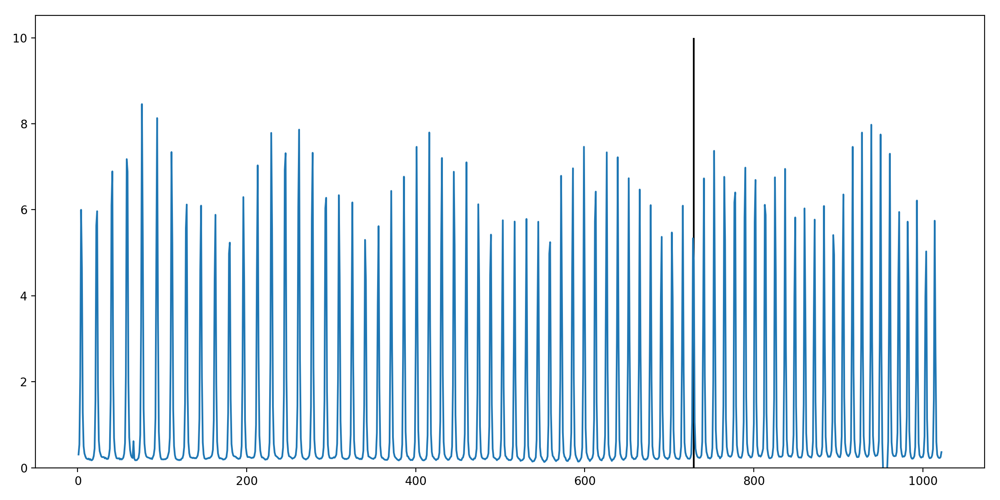

<IPython.core.display.Javascript object>


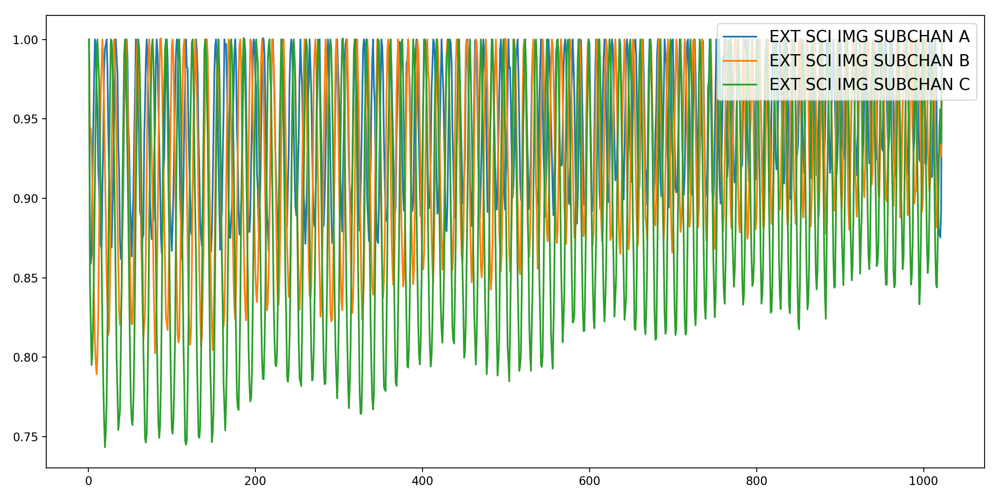

<IPython.core.display.Javascript object>


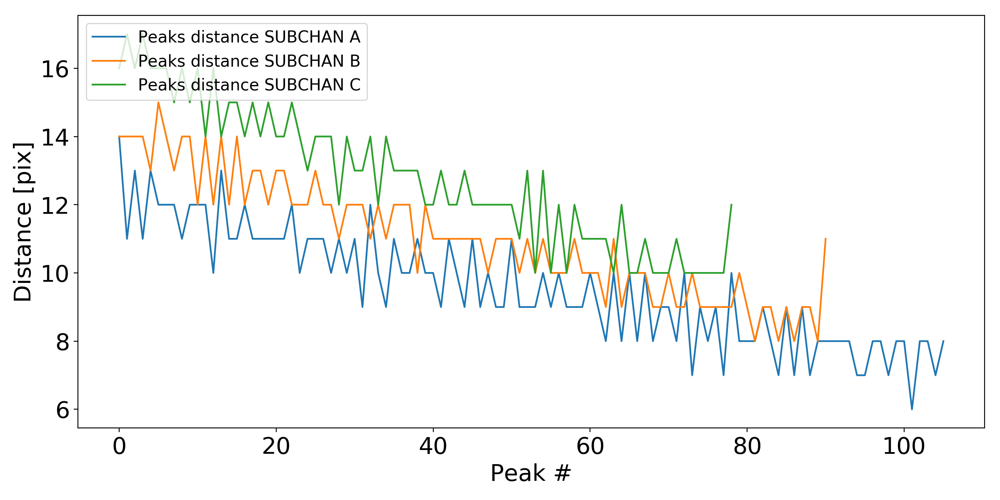

<IPython.core.display.Javascript object>


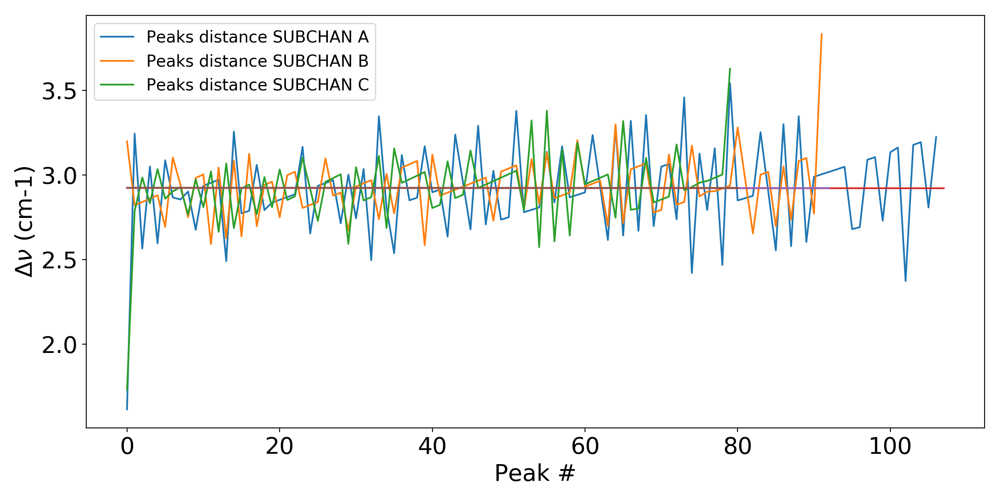

<IPython.core.display.Javascript object>


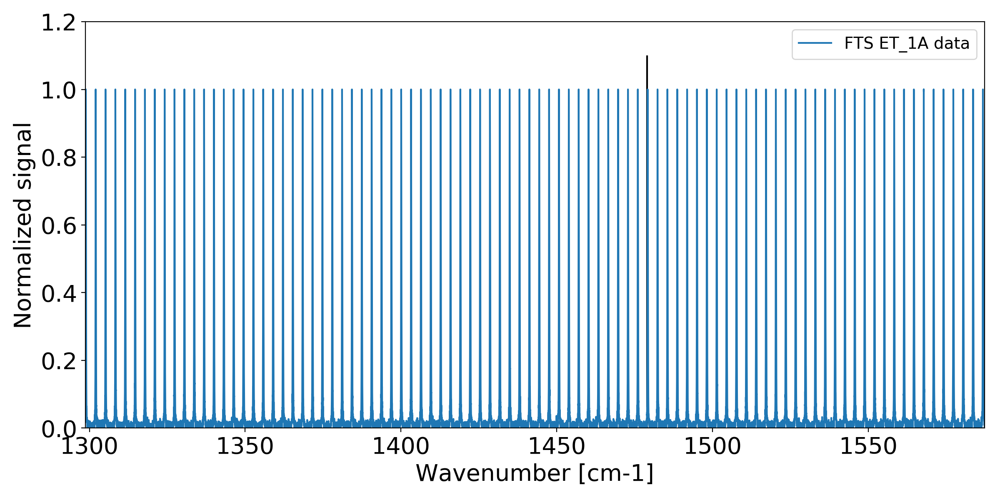

In [23]:
plt.figure(figsize=(12,6))
plt.plot(etalon1A_img[ypos,xpos],label='ET_1A')
plt.vlines(cutoffpix,0,10)
plt.ylim(0)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(reduced_img_subchanA[ypos,xpos]/ext_source_fringe_profile_subchanA,label='EXT SCI IMG SUBCHAN A')
plt.plot(reduced_img_subchanB[ypos,xpos]/ext_source_fringe_profile_subchanB,label='EXT SCI IMG SUBCHAN B')
plt.plot(reduced_img_subchanC[ypos,xpos]/ext_source_fringe_profile_subchanC,label='EXT SCI IMG SUBCHAN C')
plt.legend(loc='upper right',fontsize=14)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(np.diff(ext_source_fringe_peaks_subchanA)[1:],label='Peaks distance SUBCHAN A')
plt.plot(np.diff(ext_source_fringe_peaks_subchanB)[1:],label='Peaks distance SUBCHAN B')
plt.plot(np.diff(ext_source_fringe_peaks_subchanC)[1:],label='Peaks distance SUBCHAN C')
plt.xlabel('Peak #',fontsize=20)
plt.ylabel(r'Distance [pix]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(np.diff( wvnrMap_band1A[ypos,xpos][ext_source_fringe_peaks_subchanA] ),label='Peaks distance SUBCHAN A')
plt.plot(np.diff( wvnrMap_band1B[ypos,xpos][ext_source_fringe_peaks_subchanB] ),label='Peaks distance SUBCHAN B')
plt.plot(np.diff( wvnrMap_band1C[ypos,xpos][ext_source_fringe_peaks_subchanC] ),label='Peaks distance SUBCHAN C')
plt.plot(np.arange(len(ext_source_fringe_peaks_subchanA)),1/(2*(500*funcs.indexOfRefractionSi(10000/wvnrMap_band1A[ypos,xpos][ext_source_fringe_peaks_subchanA]))/10000.))
plt.plot(np.arange(len(ext_source_fringe_peaks_subchanB)),1/(2*(500*funcs.indexOfRefractionSi(10000/wvnrMap_band1B[ypos,xpos][ext_source_fringe_peaks_subchanB]))/10000.))
plt.plot(np.arange(len(ext_source_fringe_peaks_subchanC)),1/(2*(500*funcs.indexOfRefractionSi(10000/wvnrMap_band1C[ypos,xpos][ext_source_fringe_peaks_subchanC]))/10000.))
plt.xlabel('Peak #',fontsize=20)
plt.ylabel(r'$\Delta \nu$ (cm-1)',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(wvnrs1A_FTS_data,etalon1A_FTS_data/etalon1A_FTS_data_profile,label='FTS ET_1A data')
plt.vlines(cutoffwvnr,0,1.1)
plt.xlim(wvnrlower,wvnrupper)
plt.ylim(0,1.2)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

In [24]:
#-- Fit Etalon_1A lines in FM data
FMetalon1A_fitparams,fitting_flag = funcs.fit_etalon_lines(np.arange(det_dims[0]),etalon1A_fm_data_noNaN,FMetalon1A_peaks,fit_func='skewed_voight',sigma0=1.5,f0=0.5,a0=0.1)

# etalon line single parameters
FMetalon1A_linecenters = np.array([FMetalon1A_fitparams[i][1] for i in range(len(FMetalon1A_fitparams))])
# linefwhm   = funcs.get_FWHM(FMetalon1A_fitparams,fitting_flag)
# lineskew   = funcs.get_skewness(FMetalon1A_fitparams,fitting_flag)

#-- Fit Etalon_1A lines in FTS data
etalon1A_fitparams,fitting_flag = funcs.fit_etalon_lines(wvnrs1A_FTS_data,etalon1A_FTS_data,FTSetalon1A_peaks,fit_func='skewed_voight',sigma0=0.001,f0=0.5,a0=0.1)

# etalon line single parameters
ET1A_linecenters = np.array([etalon1A_fitparams[i][1] for i in range(len(etalon1A_fitparams))])
# linefwhm   = funcs.get_FWHM(etalon1A_fitparams,fitting_flag)
# lineskew   = funcs.get_skewness(etalon1A_fitparams,fitting_flag)

#-- Fit fringes in extended source data
FMextsource_fitparams,fitting_flag = funcs.fit_etalon_lines(np.arange(det_dims[0]),test_arr1,ext_source_fringe_peaks_subchanC[1:-1],fit_func='voight_profile',sigma0=5,f0=0.,a0=0.1)

# etalon line single parameters
FMextsource_linecenters = np.array([FMextsource_fitparams[i][1] for i in range(len(FMextsource_fitparams))])
# linefwhm   = funcs.get_FWHM(FMetalon1B_fitparams,fitting_flag)
# lineskew   = funcs.get_skewness(FMetalon1B_fitparams,fitting_flag)

<IPython.core.display.Javascript object>


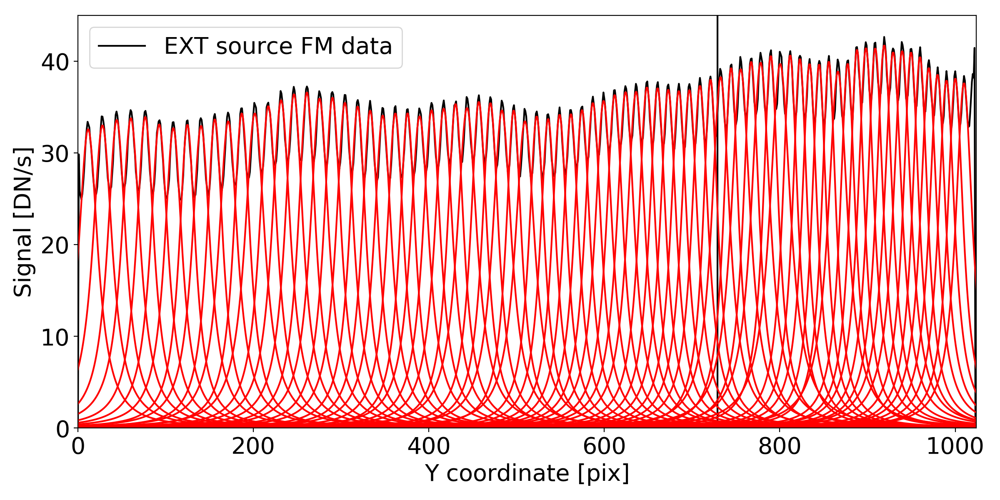

In [25]:
plt.figure(figsize=(12,6))
plt.plot(test_arr1,'k',label='EXT source FM data')
plt.vlines(cutoffpix,0,45)
funcs.plot_etalon_fit(FMextsource_fitparams,fitting_flag)
plt.xlim(0,1024)
plt.ylim(0,45)
plt.xlabel('Y coordinate [pix]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.legend(loc='upper left',fontsize=20)
plt.tight_layout()

In [26]:
# find closest line
# nearest etalon line to wavelength reference from the left
FMnearestET1Aline_LEFT = np.where(FMetalon1A_linecenters<=cutoffpix)[0][-1]
PixRef_FMnearestET1Aline_LEFT = FMetalon1A_linecenters[FMnearestET1Aline_LEFT]

ET1AnearestETline_LEFT = np.where(ET1A_linecenters<=cutoffwvnr)[0][-1]
WvnrRef_ET1AnearestETline_LEFT = ET1A_linecenters[ET1AnearestETline_LEFT]

FMnearestFRINGE_LEFT = np.where(FMextsource_linecenters<=cutoffpix)[0][-1] # nearest fringe to wavenumber reference from the left
PixRef_FMnearestFRINGE_LEFT = FMextsource_linecenters[FMnearestFRINGE_LEFT]

# nearest etalon line to wavelength reference from the right
FMnearestET1Aline_RIGHT = FMnearestET1Aline_LEFT+1
PixRef_FMnearestET1Aline_RIGHT = FMetalon1A_linecenters[FMnearestET1Aline_RIGHT]

ET1AnearestETline_RIGHT = ET1AnearestETline_LEFT+1
WvnrRef_ET1AnearestETline_RIGHT = ET1A_linecenters[ET1AnearestETline_RIGHT]

FMnearestFRINGE_RIGHT = FMnearestFRINGE_LEFT+1
PixRef_FMnearestFRINGE_RIGHT = FMextsource_linecenters[FMnearestFRINGE_RIGHT]

# Match etalon lines
idx_offset = ET1AnearestETline_LEFT-FMnearestET1Aline_LEFT
valid_FTSET1Alines = range(idx_offset,len(FMetalon1A_linecenters)+idx_offset)

print 'Reference pixel-wavenumber pair: ({}pix-{}cm-1)'.format(round(cutoffpix,2),round(cutoffwvnr,2))
print 'Closest FM ET_1A lines to the reference wavenumber (left-right): ({}-{})pix'.format(round(PixRef_FMnearestET1Aline_LEFT,2),round(PixRef_FMnearestET1Aline_RIGHT,2))
print 'Closest FTS ET_1A lines to the reference wavenumber (left-right): ({}-{})cm-1'.format(round(WvnrRef_ET1AnearestETline_LEFT,2),round(WvnrRef_ET1AnearestETline_RIGHT,2))
print 'Closest FRINGE to the reference wavenumber (left-right): ({}-{})pix'.format(round(PixRef_FMnearestFRINGE_LEFT,2),round(PixRef_FMnearestFRINGE_RIGHT,2))

Reference pixel-wavenumber pair: (728.83pix-1479.05cm-1)
Closest FM ET_1A lines to the reference wavenumber (left-right): (728.47-740.84)pix
Closest FTS ET_1A lines to the reference wavenumber (left-right): (1476.03-1479.19)cm-1
Closest FRINGE to the reference wavenumber (left-right): (721.04-732.59)pix


<IPython.core.display.Javascript object>


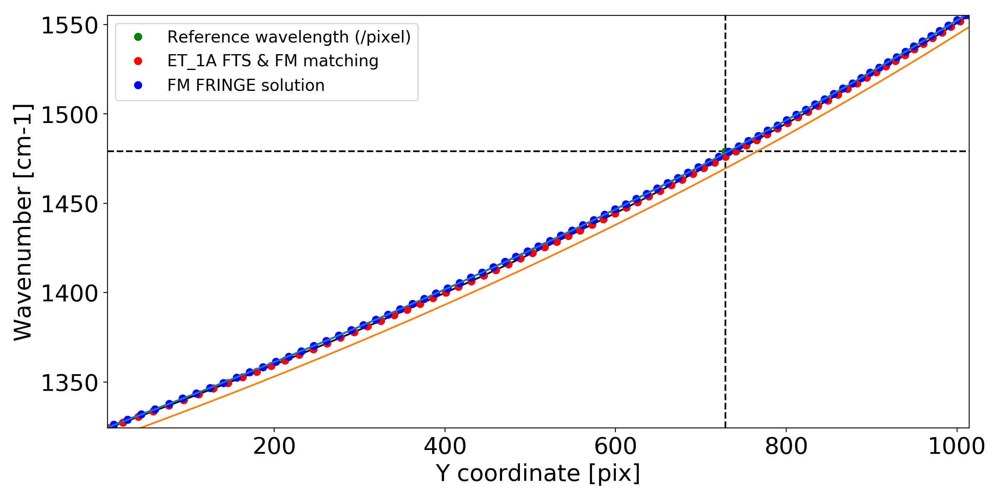

<IPython.core.display.Javascript object>


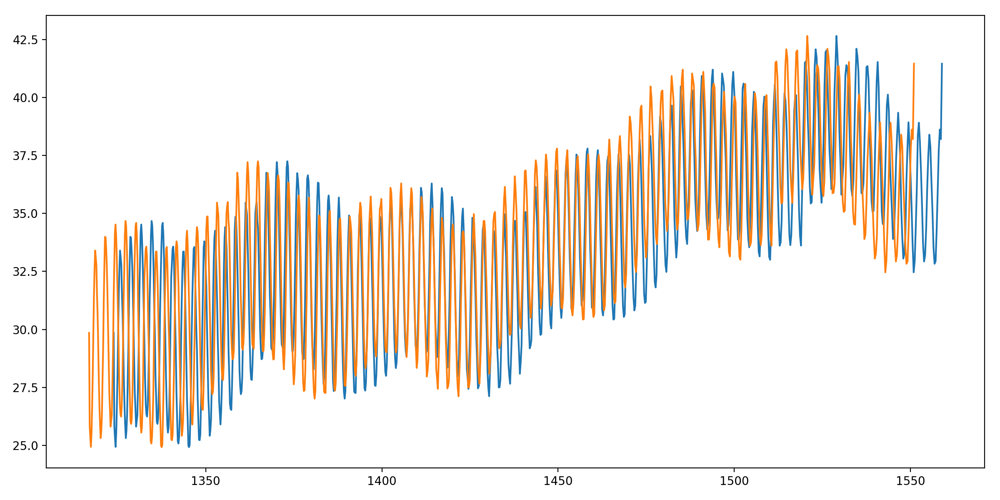

In [27]:
wvnr_grid = (np.arange(len(FMextsource_linecenters))-FMnearestFRINGE_LEFT) * 1/(2*0.1700) + WvnrRef_ET1AnearestETline_LEFT
popt,pcov = curve_fit(funcs.order3polyfit,FMextsource_linecenters,wvnr_grid)

plt.figure(figsize=(12,6))
plt.plot(cutoffpix,cutoffwvnr,'go',label='Reference wavelength (/pixel)')
plt.plot(FMetalon1A_linecenters,ET1A_linecenters[valid_FTSET1Alines],'k')
plt.plot(FMetalon1A_linecenters,ET1A_linecenters[valid_FTSET1Alines],'ro',label='ET_1A FTS & FM matching')

plt.plot(FMextsource_linecenters,wvnr_grid,'b')
plt.plot(FMextsource_linecenters,wvnr_grid,'bo',label='FM FRINGE solution')
plt.plot(np.arange(1024),funcs.order3polyfit(np.arange(1024),*popt))
plt.plot(np.arange(1024),wvnrMap_band1C[ypos,xpos])

plt.hlines(cutoffwvnr,FMetalon1A_linecenters[0],FMetalon1A_linecenters[-1],linestyle='dashed')
plt.vlines(cutoffpix,ET1A_linecenters[valid_FTSET1Alines].min(),ET1A_linecenters[valid_FTSET1Alines].max(),linestyle='dashed')

plt.xlim(FMetalon1A_linecenters[0],FMetalon1A_linecenters[-1])
plt.ylim(ET1A_linecenters[valid_FTSET1Alines].min(),ET1A_linecenters[valid_FTSET1Alines].max())
plt.xlabel('Y coordinate [pix]',fontsize=20)
plt.ylabel('Wavenumber [cm-1]',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(funcs.order3polyfit(np.arange(1024),*popt),reduced_img_subchanC[ypos,xpos])
plt.plot(wvnrMap_band1C[ypos,xpos],reduced_img_subchanC[ypos,xpos])
plt.tight_layout()

## > Modeling

In [28]:
# Assuming a geometric thickness of 500um for the whole detector
n1,n2 = funcs.indexOfRefractionSi(4.88),funcs.indexOfRefractionSi(7.7)
n_avg = (n1+n2)/2.
n_error = ((n1-n2)/n2) *100.
opt_thickness = n_avg*500. # opt. thickness, um
fringe_frequency = 1./(2.* (opt_thickness/10000.)) # cm-1

print 'Relative error on index of refraction in spectral band (from lambda_min to lambda_max) is: {}%'.format(round(n_error,2))
print 'Assumed global fringe frequency: {}cm-1'.format(round(fringe_frequency,3))

Relative error on index of refraction in spectral band (from lambda_min to lambda_max) is: 0.11%
Assumed global fringe frequency: 2.923cm-1


In [29]:
# Assuming a geometric thickness of 500um for the whole detector
omit_idxs = np.nonzero(lambdaMap[ypos,xpos])
wvls = lambdaMap[ypos,xpos][omit_idxs]
n1,n2 = funcs.indexOfRefractionSi(min(wvls)),funcs.indexOfRefractionSi(max(wvls))
n_avg = (n1+n2)/2.
n_error = ((n1-n2)/n2) *100.
opt_thickness = n_avg*500. # opt. thickness, um
fringe_frequency = 1./(2.* (opt_thickness/10000.)) # cm-1

print 'Relative error on index of refraction in spectral band (from lambda_min to lambda_max) is: {}%'.format(round(n_error,2))
print 'Assumed global fringe frequency: {}cm-1'.format(round(fringe_frequency,3))

Relative error on index of refraction in spectral band (from lambda_min to lambda_max) is: 0.03%
Assumed global fringe frequency: 2.924cm-1


## > Visualization

<IPython.core.display.Javascript object>


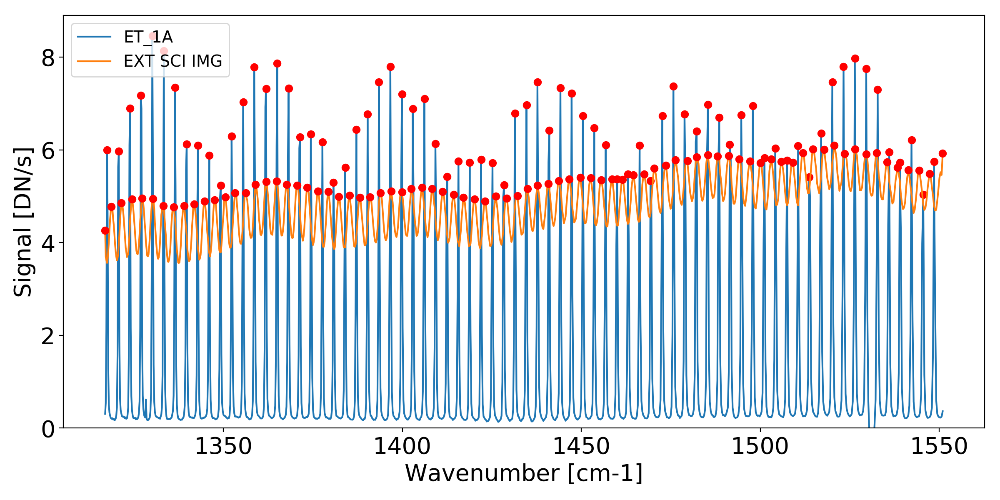

<IPython.core.display.Javascript object>


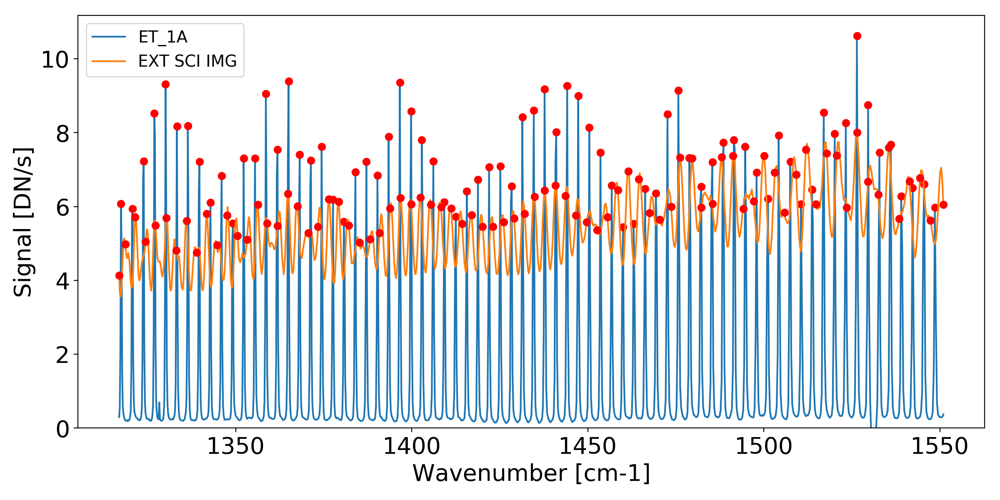

In [30]:
plt.figure(figsize=(12,6))
plt.plot(wvnrMap[ypos,xpos],etalon1A_img[ypos,xpos],label='ET_1A')
plt.plot(wvnrMap[ypos,xpos][FMetalon1A_peaks],etalon1A_img[ypos,xpos][FMetalon1A_peaks],'ro')
# plt.plot(wvnrMap[ypos,xpos],etalon1B_img[ypos,xpos],label='ET_1B')
# plt.plot(wvnrMap[ypos,xpos][FMetalon1B_peaks],etalon1B_img[ypos,xpos][FMetalon1B_peaks],'ro')
plt.plot(wvnrMap[ypos,xpos],reduced_img[ypos,xpos]/7.,label='EXT SCI IMG')
plt.plot(wvnrMap[ypos,xpos][ext_source_fringe_peaks_subchanC],reduced_img[ypos,xpos][ext_source_fringe_peaks_subchanC]/7.,'ro')
plt.ylim(0)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(wvnrMap[ypos,xpos],etalon1A_img[ypos,xpos]/fringe_img[ypos,xpos],label='ET_1A')
plt.plot(wvnrMap[ypos,xpos][FMetalon1A_peaks],(etalon1A_img[ypos,xpos]/fringe_img[ypos,xpos])[FMetalon1A_peaks],'ro')
# plt.plot(wvnrMap[ypos,xpos],etalon1B_img[ypos,xpos],label='ET_1B')
# plt.plot(wvnrMap[ypos,xpos][FMetalon1B_peaks],etalon1B_img[ypos,xpos][FMetalon1B_peaks],'ro')
plt.plot(wvnrMap[ypos,xpos],(reduced_img[ypos,xpos]/fringe_img[ypos,xpos])/7.,label='EXT SCI IMG')
plt.plot(wvnrMap[ypos,xpos][ext_source_fringe_peaks_subchanC],(reduced_img[ypos,xpos]/fringe_img[ypos,xpos])[ext_source_fringe_peaks_subchanC]/7.,'ro')
plt.ylim(0)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

<IPython.core.display.Javascript object>


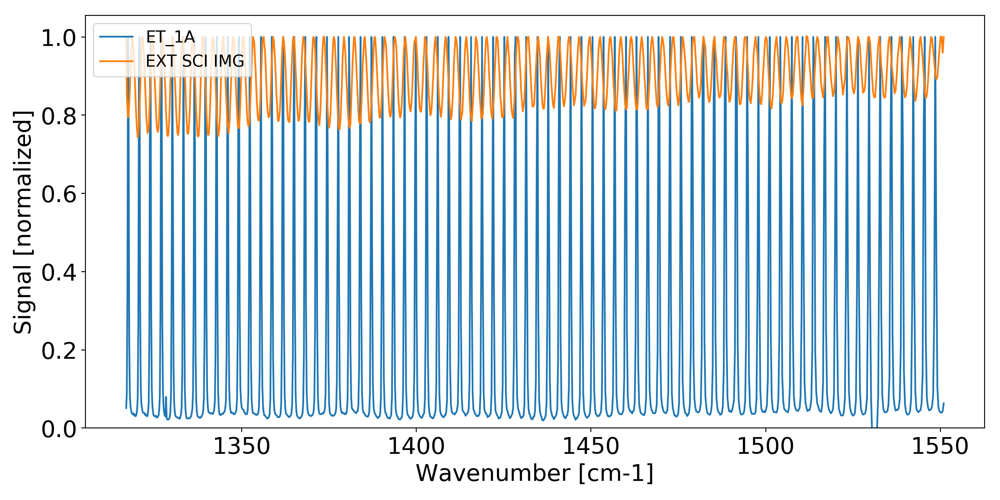

In [12]:
plt.figure(figsize=(12,6))
plt.plot(wvnrMap[ypos,xpos],etalon1A_img[ypos,xpos]/etalon1A_fm_data_profile,label='ET_1A')
plt.plot(wvnrMap[ypos,xpos],reduced_img[ypos,xpos]/ext_source_fringe_profile,label='EXT SCI IMG')
plt.ylim(0)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [normalized]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

<IPython.core.display.Javascript object>


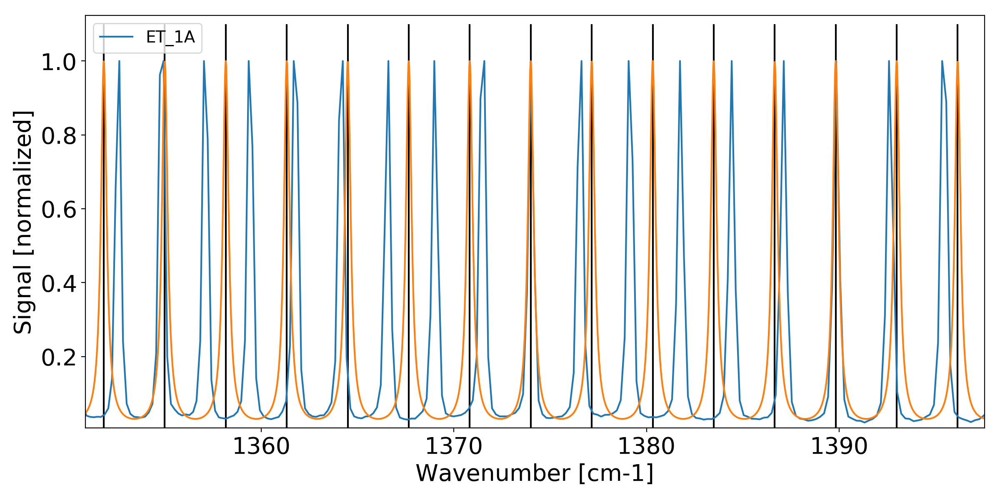

In [172]:
omit_idxs = np.nonzero(wvnrMap[ypos,xpos])

plt.figure(figsize=(12,6))
plt.plot(wvnrMap[ypos,xpos],etalon1A_img[ypos,xpos]/etalon1A_fm_data_profile,label='ET_1A')
plt.plot(np.arange(1315,1550,0.02), FPfunc(np.arange(1315,1550,0.02),0.7,1./(2.*3.16586917383),0)) # ,-0.5
plt.vlines(np.arange(410,490)*3.16586917383,0,1.1)
# plt.xlim(1315,1325)
plt.ylim(0)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [normalized]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

1.6310674989


<IPython.core.display.Javascript object>


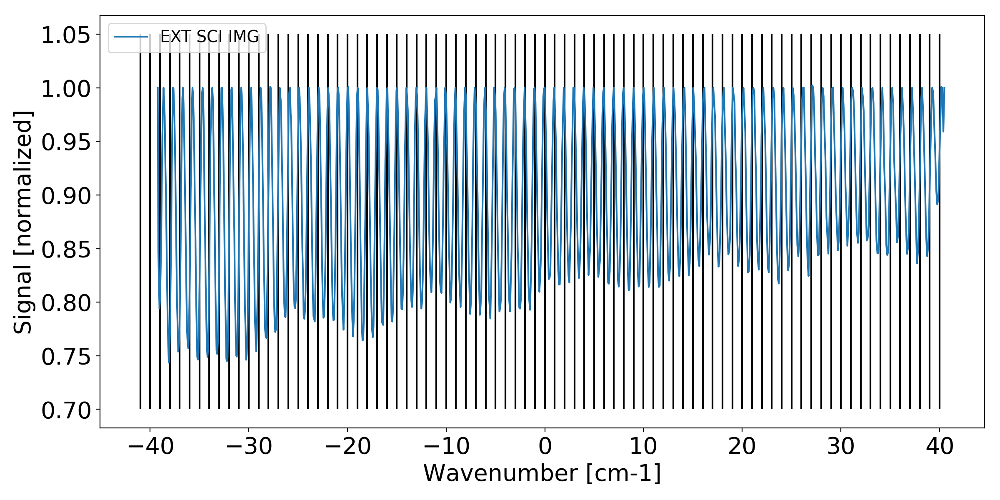

In [104]:
plt.figure(figsize=(12,6))
# plt.plot((wvnrMap[ypos,xpos]-wvnrMap[ypos,xpos][FMetalon1A_peaks[len(FMetalon1A_peaks)/2]])/3.15,etalon1A_img[ypos,xpos]/etalon1A_fm_data_profile,label='ET_1A')
plt.plot((wvnrMap[ypos,xpos]-wvnrMap[ypos,xpos][ext_source_fringe_peaks[len(ext_source_fringe_peaks)/2 -1]])/2.93651081775,reduced_img[ypos,xpos]/ext_source_fringe_profile,label='EXT SCI IMG')
plt.vlines(np.arange(-41,41),0.7,1.05)
# plt.xlim(-1,1)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [normalized]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

<IPython.core.display.Javascript object>


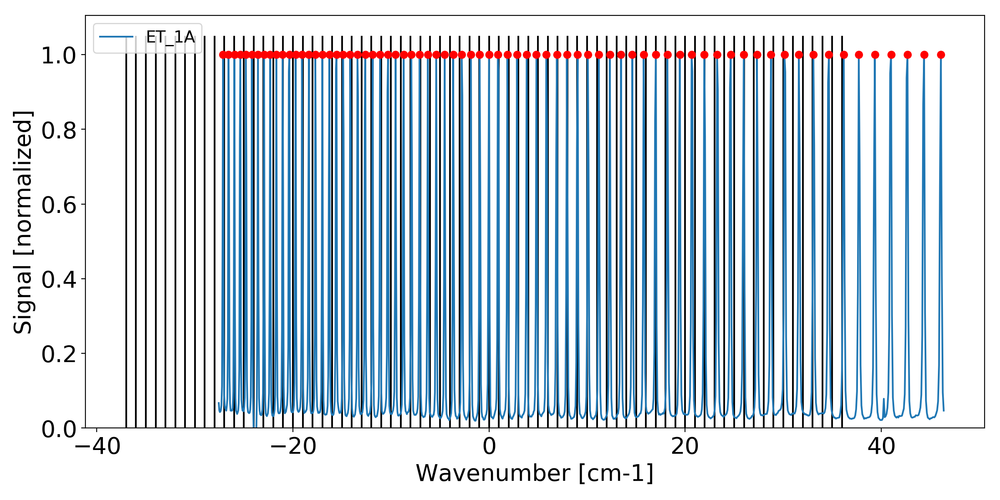

In [171]:
plt.figure(figsize=(12,6))
plt.plot((wvnrMap[ypos,xpos]-wvnrMap[ypos,xpos][FMetalon1A_peaks[len(FMetalon1A_peaks)/2]])/3.16613642972,etalon1A_img[ypos,xpos]/etalon1A_fm_data_profile,label='ET_1A')
plt.plot((wvnrMap[ypos,xpos]-wvnrMap[ypos,xpos][FMetalon1A_peaks[len(FMetalon1A_peaks)/2]])[FMetalon1A_peaks]/3.16613642972,(etalon1A_img[ypos,xpos]/etalon1A_fm_data_profile)[FMetalon1A_peaks],'ro')
plt.vlines(np.arange(-37,37),0.,1.05)
# plt.xlim(-1,1)
plt.ylim(0)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [normalized]',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

3.16613642972


<IPython.core.display.Javascript object>


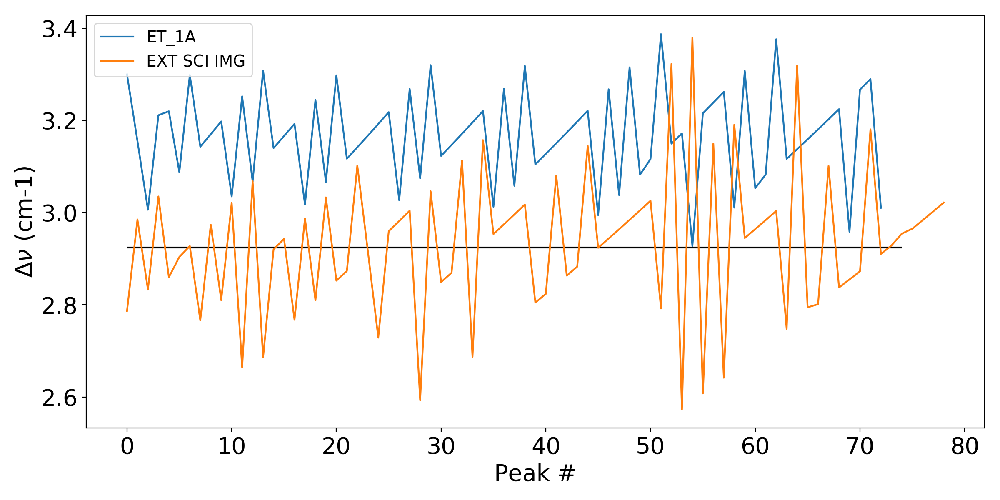

<IPython.core.display.Javascript object>


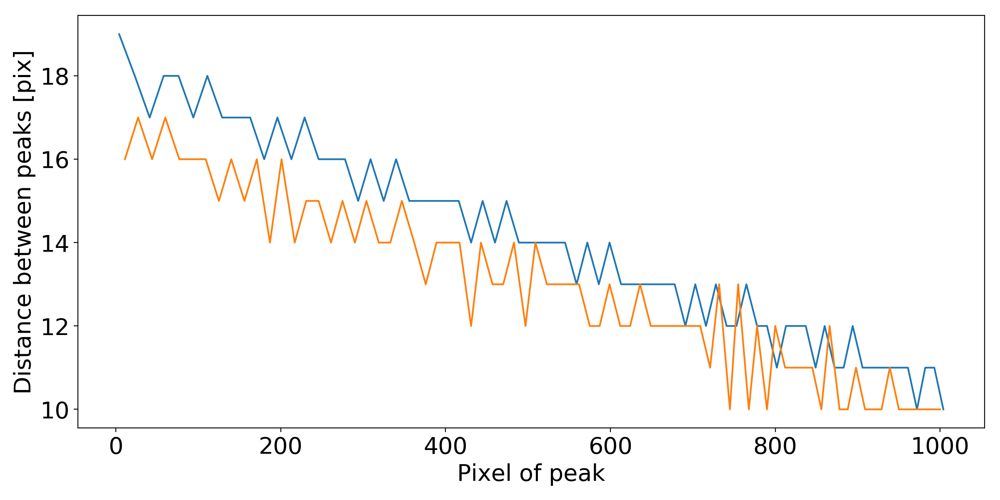

In [150]:
print np.mean(np.diff(wvnrMap[ypos,xpos][FMetalon1A_peaks]))

plt.figure(figsize=(12,6))
plt.plot(np.diff(wvnrMap[ypos,xpos][FMetalon1A_peaks]),label='ET_1A')
# plt.plot(np.diff(wvnrMap[ypos,xpos][FMetalon1B_peaks]),label='ET_1B')
plt.plot(np.diff(wvnrMap[ypos,xpos][ext_source_fringe_peaks])[np.diff(wvnrMap[ypos,xpos][ext_source_fringe_peaks]) > 2.],label='EXT SCI IMG')
plt.hlines(fringe_frequency,0,len(FMetalon1A_peaks) )
plt.xlabel('Peak #',fontsize=20)
plt.ylabel(r'$\Delta \nu$ (cm-1)',fontsize=20)
plt.legend(loc='upper left',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
plt.plot(np.array(FMetalon1A_peaks)[:-1],np.diff(np.array(FMetalon1A_peaks)))
# plt.plot(np.diff(np.array(FMetalon1B_peaks)))
plt.plot(np.array(ext_source_fringe_peaks)[1:-2][:-1],np.diff(np.array(ext_source_fringe_peaks)[1:-2]))
plt.xlabel('Pixel of peak',fontsize=20)
plt.ylabel(r'Distance between peaks [pix]',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()


## Summary:  
Insert summary here